In [2]:
import numpy as np
from matplotlib import pyplot as plt
import torch
import torch.nn as nn
import torch.nn.functional as F
from tqdm.notebook  import tqdm
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
import time as time_module

# Implementation notes

REPGAN

---

REPGAN is fairly straightforward to implement. Just need to test it out a little.




# Objective functions

In [5]:
class GaussianLoss(nn.Module):
    def __init__(self, reduction = "sum"):
        super(GaussianLoss, self).__init__()
        self.reduction = reduction
    
    def forward(self, x_recon, x):

        if isinstance(x_recon, tuple):
            #Learnt a variance on the output
            mu_recon, var_recon = x_recon

        else:
            #No learnt variance on the output
            mu_recon = x_recon
            var_recon = torch.ones_like(x_recon).requires_grad_(False)
        
        error = x - mu_recon

        B, N = x.size()
        #Assuming diagonalised covariance:
        gauss_log_loss = torch.mul(error.pow(2), 1/(2 * var_recon + 1e-12)) #2x100 error vector is needed to do normal multiplication
        gauss_log_loss += 1/2 * torch.log(var_recon + 1e-12)

        #Sum over dimensionality
        gauss_log_loss = torch.sum(gauss_log_loss, dim = 1, keepdim = True)
        
        if self.reduction.lower() == "sum":
            gauss_log_loss =  torch.sum(gauss_log_loss)

        return gauss_log_loss #Unnormalised



class KL_divergence(nn.Module):

    """
    Implement the KL divergence loss for Gaussian distributions
    """

    def __init__(self, std_normal = False):
        super(KL_divergence, self).__init__()

        self.std_normal = std_normal #A flag to check whether the loss

    def forward(self, mu_0, var_0, mu_1 = None, var_1 = None):

        if self.std_normal:
            mu_1 = torch.zeros_like(mu_0).requires_grad_(False)
            var_1 = torch.ones_like(var_0).requires_grad_(False)

        #perform everything elementwise and then 
        Dkl = var_0 / var_1 + ((mu_1 - mu_0)**2) / var_1 - 1 + torch.log(var_1 / var_0  + 1e-12)

        #Sum over dimensionality
        Dkl = 0.5 * torch.sum(Dkl, dim = 1, keepdim = True)

        return Dkl #Unnormalised

class discrete_KL_divergence(nn.Module):
    """
    Implement the KL divergence loss for sampled distributions with likelihoods
    """
    def __init__(self, no_classes):
        super(discrete_KL_divergence, self).__init__()

        self.no_classes = no_classes

    def batch_wise_entropy(self, batch_likelihoods): #Maximise this term
        B = batch_likelihoods.size(0)

        p_hat = 1/B * torch.sum(batch_likelihoods, dim = 0).reshape(1, -1)

        #print(np.round(p_hat.detach().cpu().numpy(), 3))

        batch_entropy = -B * torch.sum(p_hat * torch.log(p_hat + 1e-12))

        return batch_entropy

    def forward(self, class_prob, prior_prob = None):

        assert class_prob.size(1) == self.no_classes, "There is a mis-match between the pre-defined number of classes and the number of classes given to the discrete KL divergence."

        if prior_prob is None:
              prior_prob = torch.ones(self.no_classes) / self.no_classes

        #perform everything elementwise and then you can reduce if required
        entropy = -1 * torch.sum(class_prob * torch.log(class_prob + 1e-12), dim = 1, keepdim = True) #Entropy term
        cross_entropy = -1 * torch.sum(class_prob * torch.log(prior_prob + 1e-12), dim = 1, keepdim = True)  #Cross-entropy term
        batch_entropy = self.batch_wise_entropy(class_prob) #Batch entropy term (maximise hence minus sign)
        Dkl = entropy - cross_entropy - batch_entropy

        return Dkl, torch.mean(entropy), torch.mean(cross_entropy) #Unnormalised and I sign-corrected the entropy term.

class MoG_VAE_loss(nn.Module):
    #No ability to learn a variance, variance is controlled by the noise distribution for iVAE
    def __init__(self, no_classes, loss_name = "L2", gamma = 1, beta = 1, alpha = 1):
        super(MoG_VAE_loss, self).__init__()

        self.no_classes = no_classes

        self.gamma = gamma #Reconstruction loss KL parameter
        self.beta = beta #Continuous KL parameter
        self.alpha = alpha #Categorial KL parameter

        self.loss_name = loss_name

        if self.loss_name.lower() == "l2":
            self.recon_loss = GaussianLoss(reduction = 'none')
        
        elif self.loss_name.lower() == "l1":
            self.recon_loss = nn.L1Loss(reduction = 'none')
        
        elif self.loss_name.lower() == "bce":
              self.recon_loss = nn.BCELoss(reduction = 'none')
        
        else:
            print("Unknown loss entered.")
            raise SystemExit
        
        self.kl_loss = KL_divergence(False) #Never use a standard VAE case
        self.discrete_kl_loss = discrete_KL_divergence(self.no_classes)
        
        #######################
        #Semi-supervised losses
        #######################
        self.ss_loss_classes = torch.nn.CrossEntropyLoss()
        self.ss_loss_latent = nn.MSELoss()

    def forward(self, x, recon_x, mu_0, var_0, mu_1, var_1, q_y_G_x, prior_prob = None, CURL = False, Gumbel = False):
        
        #You need to expand the input data by no_classes and then reshape it!
        #x = torch.repeat_interleave(x, self.no_classes, dim = 0)

        B, N = x.size()

        if isinstance(recon_x, tuple) and self.loss_name.lower() != "l2": #Check if it is a tuple, will be this by default when it is fed in.
            recon_x = recon_x[0]
        
        if CURL:
            #Apply softmax to the output
            q_y_G_x = F.softmax(q_y_G_x, dim = 1)

        #Reconstruction loss
        if CURL: #second part of IF helps is you use Gumbel
            x = torch.repeat_interleave(x, self.no_classes, dim = 0)

            Lrecon = torch.sum(self.recon_loss(recon_x, x), dim = 1, keepdim = True)
            Lrecon = Lrecon.reshape(B, self.no_classes)
            Lrecon *= q_y_G_x #weight by categorical likelihood
            Lrecon = torch.sum(Lrecon) / self.no_classes  #Sum all values and normalise by no. of classes

        else:
            Lrecon = torch.sum(self.recon_loss(recon_x, x), dim = 1, keepdim = True)
            Lrecon = torch.sum(Lrecon)  #Sum all values

        if mu_0.size(0) * self.no_classes == mu_1.size(0): #A check to see if you are using single samples for many classes (VaDE only)
            mu_0 = torch.repeat_interleave(mu_0, self.no_classes, dim = 0) #Need to expand data for all the classes
            var_0 = torch.repeat_interleave(var_0, self.no_classes, dim = 0) #Need to expand data for all the classes

        #continuous KL divergence loss
        Lkl_continuous = self.kl_loss(mu_0, var_0, mu_1, var_1) #Need to normalise with same values reconstruction loss (Pytorch does this automatically unless you specify)
        
        if not Gumbel:
            Lkl_continuous = Lkl_continuous.reshape(B, self.no_classes)
            Lkl_continuous *= q_y_G_x #weight by categorical likelihood
            
        Lkl_continuous = torch.sum(Lkl_continuous) / self.no_classes #Sum all values and normalise by class size

        #discrete KL divergence loss
        Lkl_discrete, entropy, cross_entropy = self.discrete_kl_loss(q_y_G_x, prior_prob)
        Lkl_discrete = torch.sum(Lkl_discrete)  #Sum all values

        Ltotal = self.gamma * Lrecon + self.beta * Lkl_continuous + self.alpha * Lkl_discrete

        #Normalise value
        Lrecon /= (B * N)
        Lkl_continuous /= (B * N)
        Lkl_discrete /= (B * N)
        Ltotal /= (B * N)

        return Ltotal, Lrecon, Lkl_continuous, Lkl_discrete, entropy, cross_entropy

"""
#TESTING THE FUNCTIONS
no_samples = 512
no_classes = 3
a = torch.randn(no_samples, 5)
b = a + torch.randn_like(a) * 0.1
mu_0 = torch.ones_like(a)
mu_1 = torch.zeros_like(a)
var_0 = torch.ones_like(a)
var_1 = torch.ones_like(a)

a = torch.repeat_interleave(a, no_classes, dim = 0)
b = torch.repeat_interleave(b, no_classes, dim = 0)
mu_0 = torch.repeat_interleave(mu_0, no_classes, dim = 0)
mu_1 = torch.repeat_interleave(mu_1, no_classes, dim = 0)
var_0 = torch.repeat_interleave(var_0, no_classes, dim = 0)
var_1 = torch.repeat_interleave(var_1, no_classes, dim = 0)

loss = MoG_VAE_loss(no_classes)
q_y_G_x = torch.ones(no_samples, no_classes) / no_classes

print(loss(a, b, mu_0, var_0, mu_1, var_1, q_y_G_x, False))
print(loss(a, b, mu_0, var_0, mu_1, var_1, q_y_G_x, True))
print(torch.mean((b - a)**2)/2, torch.mean((b - a)**2)/(2 * no_classes))
"""

'\n#TESTING THE FUNCTIONS\nno_samples = 512\nno_classes = 3\na = torch.randn(no_samples, 5)\nb = a + torch.randn_like(a) * 0.1\nmu_0 = torch.ones_like(a)\nmu_1 = torch.zeros_like(a)\nvar_0 = torch.ones_like(a)\nvar_1 = torch.ones_like(a)\n\na = torch.repeat_interleave(a, no_classes, dim = 0)\nb = torch.repeat_interleave(b, no_classes, dim = 0)\nmu_0 = torch.repeat_interleave(mu_0, no_classes, dim = 0)\nmu_1 = torch.repeat_interleave(mu_1, no_classes, dim = 0)\nvar_0 = torch.repeat_interleave(var_0, no_classes, dim = 0)\nvar_1 = torch.repeat_interleave(var_1, no_classes, dim = 0)\n\nloss = MoG_VAE_loss(no_classes)\nq_y_G_x = torch.ones(no_samples, no_classes) / no_classes\n\nprint(loss(a, b, mu_0, var_0, mu_1, var_1, q_y_G_x, False))\nprint(loss(a, b, mu_0, var_0, mu_1, var_1, q_y_G_x, True))\nprint(torch.mean((b - a)**2)/2, torch.mean((b - a)**2)/(2 * no_classes))\n'

# GAN losses

In [17]:
class InfoGAN_loss(nn.Module):
    def __init__(self):
        super(InfoGAN_loss, self).__init__()
        #Gaussian loss and Cross entropy loss
        self.MSEloss = nn.MSELoss()
        self.CEloss = nn.NLLLoss()
    
    def forward(self, s_orig, s_recon, c_recon = None, c_targets = None):
        
        loss_s = self.MSEloss(s_orig, s_recon)
        
        if c_recon is not None:
            loss_c = self.CEloss(c_recon, c_targets)
        
            return loss_s, loss_c
        
        else:
            return loss_s

class GradientPenalty(nn.Module):
    def __init__(self):
        super(GradientPenalty, self).__init__()

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

    def forward(self, x_real, x_gen, discriminator):
        B = x_real.size(0)
        
        #set up data for interpolation
        SizeList = [B] + [1] * len(x_real.size()[1:]) #BatchSize x 1 or BatchSize x 1 x 1 x 1
        epsilon = torch.rand(SizeList).to(self.device) #Set it to a Nx1 vector that you can then expand if need be
        epsilon = epsilon.expand_as(x_real) #Replicate for each data point
        
        #generate interpolated data and make it differentiable
        with torch.no_grad():
            interpolation = epsilon * x_real + (1 - epsilon) * x_gen
            
        interpolation = interpolation.requires_grad_(True).to(self.device)
        
        #Push through discriminator
        Dinter = discriminator(interpolation)
        
        #Generate dDdX gradient vector - Make it one as we want dDdX = [[dD1/dX1 + dD2/dX1],[]] (A n by 1 vector)
        GradOut = torch.ones_like(Dinter).requires_grad_(False)
        
        GradX = torch.autograd.grad(outputs = Dinter, inputs = interpolation, grad_outputs = GradOut,  create_graph = True, retain_graph = True)[0]
        NormX = torch.sqrt(torch.sum(GradX.view(B, -1).pow(2), dim = 1) + 1e-12)
        
        GP = (NormX - 1).pow(2).mean()

        return GP

class ConsensusOptimisation(nn.Module):
    def __init__(self):
      super(ConsensusOptimisation, self).__init__()
      #TODO implement CO loss calculator
      self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
  
    def foward(self, lossD, lossG, discriminator, generator):
        #################
        #Consensus Losses
        #################

        #Get gradients (not using .backward)
        GradD = torch.autograd.grad(lossD, discriminator.parameters(), create_graph = True)
        GradG = torch.autograd.grad(lossG, generator.parameters(), create_graph = True)
        #GradDz = torch.autograd.grad(torch.mean(outputs[2]), outputs[3], create_graph = True, retain_graph = True)     
        
        normD = sum([torch.norm(gradient).pow(2) for gradient in GradD])
        normG = sum([torch.norm(gradient).pow(2) for gradient in GradG])
        #normZ = sum([torch.norm(gradient) for gradient in GradDz])
        #lossNorm =  self.gamma * (1/2) * (normD + normG)
        #lossNormZ = self._lambda * normZ
    
        #CalculateNormPercentages
        #percent_normD = np.round(normD.item(), 3)
        #percent_normG = np.round(normG.item(), 3) 

        return normD + normG

class GANloss(nn.Module):
    def __init__(self, GANType, GenType, InfoGAN = False, CO_flag = False):
        super(GANloss, self).__init__()
        self.gan_type = GANType
        self.gen_type = GenType
        self.InfoGAN = InfoGAN
        self.CO_flag = CO_flag
        
        if self.gan_type.lower() == "wasserstein":
            print("Using Wasserstein GAN loss")
            self.CostD = self.GANLoss_D(Wasserstein = True)
            self.CostG = self.GANLoss_G(Wasserstein = True, GenType = self.gen_type)
            self.GP = GradientPenalty()

        elif self.gan_type.lower() == "hinge":
            print("Using hinge GAN loss")
            self.CostD = self.GANLoss_D(Hinge = True)
            self.CostG = self.GANLoss_G(Hinge = True, GenType = self.gen_type)
        
        else:
            print("Using standard GAN loss")
            self.CostD = self.GANLoss_D()
            self.CostG = self.GANLoss_G(GenType = self.gen_type)
        
        if self.InfoGAN:
            self.CostInfo = InfoGAN_loss()
        
        if self.CO_flag:
            self.COloss = ConsensusOptimisation()
            
    @staticmethod  
    def GANLoss_D(Wasserstein = False, Hinge = False):
        
        if Wasserstein and not Hinge:
            print("\nUsing Wasserstein GAN loss on D")
            
            def DiscriminatorLoss(Data, Type):
                if Type.lower() == "real":
                    BCE = Data

                        
                elif Type.lower() == "fake":
                    BCE = -1 * Data

                return -1 * torch.mean(BCE)
        
        elif Hinge and not Wasserstein:
            print("\nUsing Hinge GAN loss on D")
            
            def DiscriminatorLoss(Data, Type):
                if Type.lower() == "real":
                    BCE = -1 + Data
                    with torch.no_grad():
                        scale = 1 * (BCE < 0)
                    
                    BCE = BCE * scale

                        
                elif Type.lower() == "fake":
                    BCE = -1 - Data
                    with torch.no_grad():
                        scale = 1 * (BCE < 0)
                    
                    BCE = BCE * scale

                return -1 * torch.mean(BCE)
        
        else:
            print("\nUsing Standard GAN loss on D")
            
            def DiscriminatorLoss(Data, Type):
                if Type.lower() == "real":
                    BCE = torch.log(Data + 1e-16)
                        
                elif Type.lower() == "fake":
                    BCE = torch.log(1 - Data + 1e-16)
        
                return -1 * torch.mean(BCE)
            
        
        return DiscriminatorLoss
    
    @staticmethod  
    def GANLoss_G(Wasserstein = False, Hinge = False, GenType = 1):
        
        if not Wasserstein and not Hinge:
            
            if GenType == 1:
                print("\nUsing Standard GAN loss on G")
                
                def GeneratorLoss(Data):
                    
                    BCE = torch.log(1 - Data + 1e-16)
                    return torch.mean(BCE)

            
            if GenType == 2:
                print("\nUsing non-saturating GAN loss on G")
                
                def GeneratorLoss(Data):

                    BCE = torch.log(Data + 1e-16)
                    return -1 * torch.mean(BCE)

                
            if GenType == 3:
                print("\nUsing KL divergence GAN loss on G")
                def GeneratorLoss(Data):
                    KL = torch.log(Data + 1e-16) - torch.log(1 - Data + 1e-16)
                    return -1 * torch.mean(KL)
        
        elif Hinge and not Wasserstein:
            
            print("\nUsing Hinge GAN loss on G")
            def GeneratorLoss(Data):
                return -1 * torch.mean(Data)
        
        else:
            print("\nUsing Wasserstein GAN loss on G")
            def GeneratorLoss(Data):
                Wass = Data
                return -1 * torch.mean(Wass)
        
        return GeneratorLoss
  
    def forward(self, x_real, x_gen, generator, discriminator, dis_update = True):
        
        #Generator input is only useful if you use Consensus Optimisation
        if self.CO_flag:

            loss_real = self.CostD(discriminator(x_real), "real")
            loss_fake = self.CostD(discriminator(x_gen.detach()), "fake")

            lossD = loss_real + loss_fake
            lossG = self.cost.CostG(discriminator(x_gen))

            #CO is defined for both losses
            loss_total = self.COloss(lossD, lossG, generator, discriminator)

        elif dis_update:
            
            loss_real = self.CostD(discriminator(x_real), "real")
            loss_fake = self.CostD(discriminator(x_gen.detach()), "fake")

            loss_total = loss_real + loss_fake

            if self.gan_type.lower() == "wasserstein": #Add gradient penalty to discriminator loss
                loss_GP = self.GP(x_real, x_gen, discriminator)

                loss_total += loss_GP
        
        else:
            loss_real = 0 #real loss does not contribute to generator update
            loss_fake = self.CostG(discriminator(x_gen))

            loss_total = loss_real + loss_fake

        return loss_total


# Models

In [18]:
# -*- coding: utf-8 -*-
"""
Created on Wed Jun  9 14:19:53 2021

@author: ryanb
"""

import torch
import torch.nn as nn

#Implement similarly to the manner I had previously
#Dict to define layers
#Checks for FF and Convolution
#Add in ability to have variance generating component in decoder (unused at this point)

class Unflatten(nn.Module):
    def __init__(self, ModelDict):
        super(Unflatten, self).__init__()
        self.ModelDict = ModelDict
        
    def forward(self, input_tensor):
        
        First_no_channels = self.ModelDict["channels"][0]

        input_tensor = input_tensor.view(-1, First_no_channels, int(input_tensor.size(1) / First_no_channels))
        
        return input_tensor

class Flatten(nn.Module): #Same name as tensorflow tf.keras.Flatten()
    def __init__(self, DisDict):
        super(Flatten, self).__init__()
        self.DisDict = DisDict
        
    def forward(self, input_tensor):

        input_tensor = input_tensor.view(input_tensor.size(0), -1)
        
        return input_tensor

class CondEncoder(nn.Module): #conditional VAE
    def __init__(self, encode_dict, activation):
        super(CondEncoder, self).__init__()
        
        self.encode_dict = encode_dict
        self.activation = activation
        self.layers = []
        
        if self.encode_dict["conv_flag"]:
            
            self.conv_layers = []
            for i in range(len(self.encode_dict["channels"]) - 1):

                #append the layer
                self.conv_layers.append( nn.Conv1d(in_channels = self.encode_dict["channels"][i], out_channels = self.encode_dict["channels"][i + 1], kernel_size = self.encode_dict["kernel_size"][i], stride = self.encode_dict["stride"][i], padding = self.encode_dict["padding"][i]) )
                #append the activation function
                self.conv_layers.append(self.activation)
            
            #append the transform to take the nn.linear to a convolutional layer
            self.conv_layers.append(Flatten(self.encode_dict))
            
            self.conv_encode = nn.Sequential(*self.conv_layers)
                
            
        for i in range(len(self.encode_dict["ff_layers"]) - 2):
            #append the layer
            self.layers.append(nn.Linear(in_features = self.encode_dict["ff_layers"][i], out_features = self.encode_dict["ff_layers"][i + 1], bias = True))
            #append the activation function
            self.layers.append(self.activation)
        
        self.layers.pop(-1)
        self.ff_encode = nn.Sequential(*self.layers)
        
    def forward(self, x, labels = None, cont_input = None):
        #Takes in both the x and u variables
        #Just so that you don't forget, you coded this so that it takes both inputs in, combines them and then spits out the output
        #Always stack as [continuous, discrete]
        
        if self.encode_dict['conv_flag']:
            
            x = self.conv_encode(x)
            
        if cont_input is not None:
            x_input = torch.hstack((x, cont_input))

        if labels is not None:
            u_input = labels#self.one_hot_encode(labels)
            x_input = torch.hstack((x, u_input))
        
        z_encode = self.ff_encode(x_input)
        
        return z_encode
            
class Encoder(nn.Module):
    def __init__(self, latent_size, Usize, data_size, encode_dict, var_flag = False):
        super(Encoder, self).__init__()

        self.latent_size = latent_size
        self.Usize = Usize
        self.data_size = data_size
        self.encode_dict = encode_dict
        self.var_flag = var_flag

        self.activation = nn.LeakyReLU(0.1)
        self.var_activation = nn.Softplus()
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        
        #Check if it is a standard VAE through Usize
        if self.Usize == 0:
            self.standard_flag = True

        else:
            self.standard_flag = False

        self.layers = [] #Initialise layers 
        
        if self.standard_flag: #standard VAE
            if self.encode_dict["conv_flag"]:
                
                for i in range(len(self.encode_dict["channels"]) - 1):
    
                    #append the layer
                    self.layers.append( nn.Conv1d(in_channels = self.encode_dict["channels"][i], out_channels = self.encode_dict["channels"][i + 1], kernel_size = self.encode_dict["kernel_size"][i], stride = self.encode_dict["stride"][i], padding = self.encode_dict["padding"][i]) )
                    #append the activation function
                    self.layers.append(self.activation)
                
                #append the transform to take the nn.linear to a convolutional layer
                self.layers.append(Flatten(self.encode_dict))
          
            for i in range(len(self.encode_dict["ff_layers"]) - 2):
                #append the layer
                self.layers.append(nn.Linear(in_features = self.encode_dict["ff_layers"][i], out_features = self.encode_dict["ff_layers"][i + 1], bias = True))
                #append the activation function
                self.layers.append(self.activation)
            
            self.layers.pop(-1)
            self.encode_net = nn.Sequential(*self.layers)
            
        else:
            #Add Usize to first FF layer
            self.encode_net = CondEncoder(self.encode_dict, self.activation)
            
        self.mu_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.encode_dict["ff_layers"][-1])

        if self.var_flag:
            self.var_layer = nn.Sequential(nn.Linear(self.encode_dict["ff_layers"][-2], self.encode_dict["ff_layers"][-1]), self.var_activation)
        
        #self.encode_net.apply(self.init_weights)
        #self.mu_layer.apply(self.init_weights)
        #self.var_layer.apply(self.init_weights)
    
    @staticmethod
    def init_weights(m):
        if type(m) == nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight)
            #m.bias.data.fill_(0.01)
    
    def one_hot_encode(self, labels):

        with torch.no_grad():
            label_mat = torch.zeros(labels.size(0), self.Usize)

            label_mat[range(labels.size(0)), labels] = 1

            return label_mat
  
    def forward(self, x, labels = None, cont_input = None):
        
        if self.encode_dict['conv_flag']:
            x = x.unsqueeze(1)
        
        if self.standard_flag:
            encode = self.encode_net(x)
        
        else:
            encode = self.encode_net(x, labels, cont_input)
        
        mu_z = self.mu_layer(encode)

        if self.var_flag:
            var_z = self.var_layer(encode)
        
        else:
            with torch.no_grad():
                var_z = torch.zeros_like(mu_z).requires_grad_(False) #For AAE you actually don't want the variance

        return mu_z, var_z

class REPGAN_Encoder(nn.Module):
    def __init__(self, latent_sizes, Usize, data_size, encode_dict, var_flag = False):
        super(REPGAN_Encoder, self).__init__()

        self.latent_sizes = latent_sizes
        self.latent_size = sum(self.latent_sizes)
        self.Usize = Usize
        self.data_size = data_size
        self.encode_dict = encode_dict
        self.var_flag = var_flag

        self.activation = nn.LeakyReLU(0.1)
        self.var_activation = nn.Softplus()
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        
        #Check if it is a standard VAE through Usize
        if self.Usize == 0:
            self.standard_flag = True

        else:
            self.standard_flag = False

        self.layers = [] #Initialise layers 
        
        if self.standard_flag: #standard VAE
            if self.encode_dict["conv_flag"]:
                
                for i in range(len(self.encode_dict["channels"]) - 1):
    
                    #append the layer
                    self.layers.append( nn.Conv1d(in_channels = self.encode_dict["channels"][i], out_channels = self.encode_dict["channels"][i + 1], kernel_size = self.encode_dict["kernel_size"][i], stride = self.encode_dict["stride"][i], padding = self.encode_dict["padding"][i]) )
                    #append the activation function
                    self.layers.append(self.activation)
                
                #append the transform to take the nn.linear to a convolutional layer
                self.layers.append(Flatten(self.encode_dict))
          
            for i in range(len(self.encode_dict["ff_layers"]) - 2):
                #append the layer
                self.layers.append(nn.Linear(in_features = self.encode_dict["ff_layers"][i], out_features = self.encode_dict["ff_layers"][i + 1], bias = True))
                #append the activation function
                self.layers.append(self.activation)
            
            self.layers.pop(-1)
            self.encode_net = nn.Sequential(*self.layers)
            
        else:
            #Add Usize to first FF layer
            self.encode_net = CondEncoder(self.encode_dict, self.activation)
        
        if len(self.latent_sizes) == 1:
            self.n_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[0])
        
        elif len(self.latent_sizes) == 2:
            self.c_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[0])
            self.n_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[1])
            
        elif len(self.latent_sizes) == 3:
            self.s_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[0])
            self.c_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[1])
            self.n_layer = nn.Linear(self.encode_dict["ff_layers"][-2], self.latent_sizes[2])

        if self.var_flag:
            self.var_layer = nn.Sequential(nn.Linear(self.encode_dict["ff_layers"][-2], self.encode_dict["ff_layers"][-1]), self.var_activation)
        
        #self.encode_net.apply(self.init_weights)
        #self.mu_layer.apply(self.init_weights)
        #self.var_layer.apply(self.init_weights)
    
    @staticmethod
    def init_weights(m):
        if type(m) == nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight)
            #m.bias.data.fill_(0.01)
    
    def local_layer_wrapper(self, encode_out, softmax = False):
        if len(self.latent_sizes) == 1:
            n = self.n_layer(encode_out)
            z = n

        elif len(self.latent_sizes) == 2:
            c = self.c_layer(encode_out)
            n = self.n_layer(encode_out)

            if softmax:
                c = F.softmax(c, dim = 1)

            z = torch.hstack((c, n))

        elif len(self.latent_sizes) == 3:
            s = self.s_layer(encode_out)
            c = self.c_layer(encode_out)

            if softmax:
                c = F.softmax(c, dim = 1)

            n = self.n_layer(encode_out)
            z = torch.hstack((s, c, n))

        return z
        
  
    def forward(self, x, labels = None, cont_input = None, softmax_flag = True):
        
        if self.encode_dict['conv_flag']:
            x = x.unsqueeze(1)
        
        if self.standard_flag:
            encode = self.encode_net(x)
        
        else:
            encode = self.encode_net(x, labels, cont_input)

        mu_z = self.local_layer_wrapper(encode, softmax_flag)

        if self.var_flag:
            var_z = self.var_layer(encode)
        
        else:
            with torch.no_grad():
                var_z = torch.zeros_like(mu_z).requires_grad_(False) #For AAE and REPGAN you actually don't want the variance

        return mu_z, var_z

class Decoder(nn.Module):
    def __init__(self, latent_size, Usize, data_size, decode_dict, var_flag = False, binary_flag = False):
        super(Decoder, self).__init__()

        self.latent_size = latent_size
        self.Usize = Usize
        self.data_size = data_size
        self.decode_dict = decode_dict
        self.var_flag = var_flag
        self.binary_flag = binary_flag
        self.activation = nn.LeakyReLU(0.1)    
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        self.layers = [] #Initialise layers 
        
        if not self.decode_dict["conv_flag"]:
            for i in range(len(self.decode_dict["ff_layers"]) - 2):
                #append the layer
                self.layers.append(nn.Linear(in_features = self.decode_dict["ff_layers"][i], out_features = self.decode_dict["ff_layers"][i + 1], bias = True))
                #append the activation function
                self.layers.append(self.activation)
            
            self.layers.pop(-1) #remove the final activation for linear outputs
    
            self.decode_net = nn.Sequential(*self.layers)
            self.gen_layer = nn.Linear(self.decode_dict["ff_layers"][-2], self.decode_dict["ff_layers"][-1])

            if self.binary_flag: #For MNIST or something like that
                print("Making binary layer")
                self.gen_layer = nn.Sequential(self.gen_layer, nn.Sigmoid())
            
            if self.var_flag:
                self.var_layer = nn.Sequential(nn.Linear(self.decode_dict["ff_layers"][-2], self.decode_dict["ff_layers"][-1]), nn.Softplus())
                #self.var_layer.apply(self.init_weights)
        
         
        else:
            for i in range(len(self.decode_dict["ff_layers"]) - 1):
                #append the layer
                self.layers.append(nn.Linear(in_features = self.decode_dict["ff_layers"][i], out_features = self.decode_dict["ff_layers"][i + 1], bias = True))
                #append the activation function
                self.layers.append(self.activation)
        
            #append the transform to take the nn.linear to a convolutional layer
            self.layers.append(Unflatten(self.decode_dict))
            
            for i in range(len(self.decode_dict["channels"]) - 2):

                #append the layer
                self.layers.append( nn.ConvTranspose1d(in_channels = self.decode_dict["channels"][i], out_channels = self.decode_dict["channels"][i + 1], kernel_size = self.decode_dict["kernel_size"][i], stride = self.decode_dict["stride"][i], padding = self.decode_dict["padding"][i]) )
                #append the activation function
                self.layers.append(self.activation)
        
            self.layers.pop(-1) #remove the final activation for linear outputs
    
            self.decode_net = nn.Sequential(*self.layers)
            self.gen_layer = nn.ConvTranspose1d(in_channels = self.decode_dict["channels"][-2], out_channels = self.decode_dict["channels"][-1], kernel_size = self.decode_dict["kernel_size"][-1], stride = self.decode_dict["stride"][-1], padding = self.decode_dict["padding"][-1])

            if self.binary_flag: #For MNIST or something like that
                print("Making binary layer")
                self.gen_layer = nn.Sequential(self.gen_layer, nn.Sigmoid())

            #self.decode_net.apply(self.init_weights)
            #self.gen_layer.apply(self.init_weights)

            if self.var_flag:
                self.var_layer = nn.Sequential(nn.ConvTranspose1d(in_channels = self.decode_dict["channels"][-2], out_channels = self.decode_dict["channels"][-1], kernel_size = self.decode_dict["kernel_size"][-1], stride = self.decode_dict["stride"][-1], padding = self.decode_dict["padding"][-1])
                                               , nn.Softplus())
                #self.var_layer.apply(self.init_weights)
        

    @staticmethod
    def init_weights(m):
        if type(m) == nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight)
            #m.bias.data.fill_(0.01)

    @staticmethod
    def reparametrisation_trick(mu_data, var_data):
        with torch.no_grad():
            eta = torch.randn_like(mu_data)

        return mu_data + eta * torch.sqrt(var_data)

    def forward(self, mu_latent, var_latent):

        z_latent = self.reparametrisation_trick(mu_latent, var_latent)

        decode_out = self.decode_net(z_latent)

        x_out = self.gen_layer(decode_out)

        if self.var_flag:
            var_out = self.var_layer(decode_out)
            
        else:
            var_out = torch.ones_like(x_out).requires_grad_(False)
        
        if self.decode_dict["conv_flag"]:
            x_out = x_out.squeeze(1)
            var_out = var_out.squeeze(1)
            
        return x_out, var_out

        
  
class ConditionalPrior(nn.Module):
    #Can adapt to have parametric densities... (only a mean and variance parameter depending on the class)
    def __init__(self, latent_size, Usize, data_size, prior_dict, continuous_prior = True):
        super(ConditionalPrior, self).__init__()

        self.latent_size = latent_size
        self.Usize = Usize
        self.data_size = data_size
        self.prior_dict = prior_dict
        self.continuous_prior = continuous_prior

        self.activation = nn.LeakyReLU(0.1)
        self.var_activation = nn.Softplus()
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        #Check if it is a standard VAE, if so, set continuous_prior to False and then set distribution to N(0, I)
        if self.Usize == 0:
            self.continuous_prior = False

        self.layers = [] #Initialise layers 
        
        if self.continuous_prior:
            #Define model - essentially another generator but with only FF layers, by design

            for i in range(len(self.prior_dict["ff_layers"]) - 2):
                #append the layer
                self.layers.append(nn.Linear(in_features = self.prior_dict["ff_layers"][i], out_features = self.prior_dict["ff_layers"][i + 1], bias = True))
                #append the activation function
                self.layers.append(self.activation)
          
            self.layers.pop(-1)
            self.prior_net = nn.Sequential(*self.layers)
            self.prior_mu = nn.Linear(self.prior_dict["ff_layers"][-2], self.prior_dict["ff_layers"][-1])
            self.prior_var = nn.Linear(self.prior_dict["ff_layers"][-2], self.prior_dict["ff_layers"][-1])

            #self.prior_net.apply(self.init_weights)
            #self.prior_mu.apply(self.init_weights)
            #self.prior_var.apply(self.init_weights)
      
        else:
            #Lambda functions that just return the mean and variance parameters at all the class locations of interest!

            self.prior_net = lambda U: U
            
            
            if self.Usize == 0:
                #self._prior_mu_ = nn.parameter.Parameter(torch.Tensor(1, self.latent_size))
                #self._prior_var_ = nn.parameter.Parameter(torch.Tensor(1, self.latent_size))
                self.register_parameter(name='_prior_mu_', param=torch.nn.Parameter(torch.Tensor(1, self.latent_size)))
                self.register_parameter(name='_prior_var_', param=torch.nn.Parameter(torch.Tensor(1, self.latent_size)))

            else:
                self.register_parameter(name='_prior_mu_', param=torch.nn.Parameter(torch.Tensor(self.Usize, self.latent_size)))
                self.register_parameter(name='_prior_var_', param=torch.nn.Parameter(torch.Tensor(self.Usize, self.latent_size)))
                #self._prior_mu_ = nn.parameter.Parameter(torch.Tensor(self.Usize, self.latent_size))
                #self._prior_var_ = nn.parameter.Parameter(torch.Tensor(self.Usize, self.latent_size))#torch.ones(self.Usize, self.latent_size).to(self.device)#

                self.prior_mu = lambda U: self._prior_mu_[torch.argmax(U, dim = 1), :]
                self.prior_var = lambda U: self._prior_var_[torch.argmax(U, dim = 1), :]

            with torch.no_grad(): #initialise parameters
                if self.Usize == 0:
                    #Set to N(0, I)
                    self._prior_mu_.fill_(0)
                    self._prior_var_.fill_(1)
                    #Turn off gradient flag
                    self._prior_mu_.requires_grad_(False)
                    self._prior_var_.requires_grad_(False)
                    
                else:
                    self._prior_mu_.normal_(0, 0.1)
                    self._prior_var_.normal_(0, 0.1)

    @staticmethod
    def init_weights(m):
        if type(m) == nn.Linear:
            torch.nn.init.xavier_uniform_(m.weight)
            #m.bias.data.fill_(0.01)
    
    def one_hot_encode(self, labels):

        with torch.no_grad():
            label_mat = torch.zeros(labels.size(0), self.Usize)
            label_mat[range(labels.size(0)), labels] = 1

            return label_mat
    
    def forward(self, labels = None, cont_input = None):
        #Always stack as [continuous, discrete]
        if self.Usize == 0:
            return self._prior_mu_, self._prior_var_

        else:
            #if self.continuous_prior:
            #    u_input = self.one_hot_encode(labels)
            
            #else:
            u_input = labels
            
            
            if cont_input is not None:
                u_input = torch.hstack((cont_input, u_input))

            prior_net = self.prior_net(u_input)
            mu = self.prior_mu(prior_net)
            var = self.var_activation(self.prior_var(prior_net)) 
            
            return mu, var

class VAE_model(nn.Module):
    def __init__(self, input_size, latent_size, U_size = None, EncodeDict = None, DecodeDict = None, PriorDict = None, var_decode = False, continuous_prior = True):
        super(VAE_model, self).__init__()
        
        self.input_size = input_size
        self.latent_size = latent_size
        self.U_size = U_size
        self.encode_dict = EncodeDict
        self.decode_dict = DecodeDict
        self.prior_dict = PriorDict
        self.var_decode = var_decode
        self.continuous_prior = continuous_prior

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        
        self.model_HI_names = ["HI_1"]
        self.model_HI_names_pretty = [r"$NLL_{recon}$"]
        
        #self.U_size
        self.encoder = Encoder(self.latent_size, 0, self.input_size, self.encode_dict)
        self.decoder = Decoder(self.latent_size, self.U_size, self.input_size, self.decode_dict, var_flag = var_decode)
        self.prior = ConditionalPrior(self.latent_size, self.U_size, self.input_size, self.prior_dict, continuous_prior = self.continuous_prior)

        if self.U_size == 0:
            print("\nInitialising a normal VAE!\n")
            self.standard_flag = True
        
        else:
            self.standard_flag = False 
  
    def train(self):
        self.encoder.train()
        self.decoder.train()
        self.prior.train()
    
    def eval(self):
        self.encoder.eval()
        self.decoder.eval()
        self.prior.eval()

    def to(self, device):
        self.encoder.to(device)
        self.decoder.to(device)
        self.prior.to(device)
    
    def one_hot_encode(self, labels):

        with torch.no_grad():
            label_mat = torch.zeros(labels.size(0), self.Usize)
            label_mat[range(labels.size(0)), labels] = 1

            return label_mat

    def compute_HIs(self, x, labels = None, cont_input = None): #Only useful if you are performing anomaly detection (specific to another project)
        with torch.no_grad():

            mu_latent, var_latent = self.encoder(x, labels, cont_input)

            x_recon1, var_decoder =  self.decoder(mu_latent, var_latent) 
            HI_1 = (1 / x.shape[1]) * torch.sum((x - x_recon1)**2 / (var_decoder), dim = 1) 

            return HI_1, mu_latent

class VAE_optimiser(object):
    def __init__(self, model, Params):
        ls = list(model.encoder.parameters()) + list(model.decoder.parameters()) + list(model.prior.parameters())
        self.VAE_opt = torch.optim.Adam(ls, lr = Params.learning_rate)
    
    def step(self):
        self.VAE_opt.step()

    def zero_grad(self):
        self.VAE_opt.zero_grad()

# REPGAN

In [24]:
class REPGAN_model(nn.Module):
    def __init__(self, input_size, latent_sizes, EncodeDict = None, DecodeDict = None, PriorDict = None, var_decode = False, binary_decode = False, continuous_prior = False, InfoGAN_flag = False):
        super(REPGAN_model, self).__init__()
        
        self.input_size = input_size
        self.latent_sizes = latent_sizes #[s, c, n]
        self.U_size = 0 #To ensure that it is a standard GAN
        self.encode_dict = EncodeDict
        self.decode_dict = DecodeDict
        self.prior_dict = PriorDict
        self.var_decode = var_decode
        self.binary_decode = binary_decode
        self.continuous_prior = continuous_prior 
        self.InfoGAN_flag = InfoGAN_flag

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        
        self.model_HI_names = ["HI_1", "HI_2", "HI_3"]
        self.model_HI_names_pretty = [r"$NLL_{recon}$", r"$\mathcal{D}_\mathbf{z}$"]
        
        #self.U_size
        self.encoder = REPGAN_Encoder(self.latent_sizes, self.U_size, self.input_size, self.encode_dict)
        self.decoder = Decoder(sum(self.latent_sizes), self.U_size, self.input_size, self.decode_dict, var_flag = var_decode, binary_flag = self.binary_decode)
        
        if len(self.latent_sizes) == 1: #Only N
            self.latent_discriminator = WGAN_discriminator(self.latent_sizes[0], sigmoid_flag = False) #WGANs
            
            self.N_prior = ConditionalPrior(self.latent_sizes[0], self.U_size, self.input_size, self.prior_dict, continuous_prior = self.continuous_prior)
        
        elif len(self.latent_sizes) == 2: #C and N
            self.class_discriminator = WGAN_discriminator(self.latent_sizes[0], noise_var = 0.1, sigmoid_flag = False) #WGANs
            self.latent_discriminator = WGAN_discriminator(self.latent_sizes[1], sigmoid_flag = False) #WGANs
            
            self.N_prior = ConditionalPrior(self.latent_sizes[1], self.U_size, self.input_size, self.prior_dict, continuous_prior = self.continuous_prior)

        elif len(self.latent_sizes) == 3:#S, C and N
            self.continuous_discriminator = WGAN_discriminator(self.latent_sizes[0], net_size = 1000, sigmoid_flag = False) #WGANs
            self.class_discriminator = WGAN_discriminator(self.latent_sizes[1], net_size = 1000, noise_var = 0.1, sigmoid_flag = False) #WGANs
            self.latent_discriminator = WGAN_discriminator(self.latent_sizes[2], net_size = 1000, sigmoid_flag = False) #WGANs

            self.S_prior = ConditionalPrior(self.latent_sizes[0], self.U_size, self.input_size, self.prior_dict, continuous_prior = self.continuous_prior)
            self.N_prior = ConditionalPrior(self.latent_sizes[2], self.U_size, self.input_size, self.prior_dict, continuous_prior = self.continuous_prior)
        
        self.data_discriminator = WGAN_discriminator(self.input_size, net_size = 1000, sigmoid_flag = True, spec_norm = False) #Can use more complex networks later

        if self.U_size == 0:
            print("\nInitialising a normal VAE!\n")
            self.standard_flag = True
        
        else:
            self.standard_flag = False 
  
    def train(self):
        self.encoder.train()
        self.decoder.train()
        self.N_prior.train()
        
        self.data_discriminator.train()

        if len(self.latent_sizes) == 1: #Only N
            self.latent_discriminator.train()
        
        elif len(self.latent_sizes) == 2: #C and N
            self.class_discriminator.train()
            self.latent_discriminator.train()
        
        elif len(self.latent_sizes) == 3: #S, C and N
            self.S_prior.train()
            self.continuous_discriminator.train()
            self.class_discriminator.train()
            self.latent_discriminator.train()
            

    
    def eval(self):
        self.encoder.eval()
        self.decoder.eval()
        self.N_prior.eval()
        self.data_discriminator.eval()

        if len(self.latent_sizes) == 1: #Only N
            self.latent_discriminator.eval()
        
        elif len(self.latent_sizes) == 2: #C and N
            self.class_discriminator.eval()
            self.latent_discriminator.eval()
        
        elif len(self.latent_sizes) == 3: #S, C and N
            self.continuous_discriminator.eval()
            self.class_discriminator.eval()
            self.latent_discriminator.eval()
            self.S_prior.eval()

    def to(self, device):
        self.encoder.to(device)
        self.decoder.to(device)
        self.N_prior.to(device)
        self.data_discriminator.to(device)

        if len(self.latent_sizes) == 1: #Only N
            self.latent_discriminator.to(device)
        
        elif len(self.latent_sizes) == 2: #C and N
            self.class_discriminator.to(device)
            self.latent_discriminator.to(device)
        
        elif len(self.latent_sizes) == 3: #S, C and N
            self.continuous_discriminator.to(device)
            self.class_discriminator.to(device)
            self.latent_discriminator.to(device)
            self.S_prior.to(device)

    def compute_HIs(self, x, labels = None, cont_input = None): #Only useful if you are performing anomaly detection (specific to another project)
        with torch.no_grad():

            mu_latent, var_latent = self.encoder(x, labels, cont_input)

            x_recon1, var_decoder =  self.decoder(mu_latent, torch.zeros_like(var_latent))
            HI_1 = (1 / x.shape[1]) * torch.sum((x - x_recon1)**2 / (var_decoder), dim = 1) 

            Dx = self.data_discriminator(x)

            Dz = self.latent_discriminator(mu_latent)

            return HI_1, Dx, Dz, mu_latent

# REPGAN optimiser

In [25]:
class REPGAN_optimiser(object):
    def __init__(self, model, Params = None, pair_flag = False, InfoGAN_flag = False):

        self.pair_flag = pair_flag

        ls_recon = list(model.encoder.parameters()) + list(model.decoder.parameters())# + list(model.prior.parameters())

        #L2 loss (AAE)
        self.recon_opt = torch.optim.Adam(ls_recon, lr = 1e-3)

        #Latent regularisers (shared optimiser?)
        self.Gz_regularisation_opt = torch.optim.Adam(model.encoder.parameters(), lr = 1e-3)

        if len(model.latent_sizes) == 1: #Only N
            ls_regularisation = model.latent_discriminator.parameters()
            
        elif len(model.latent_sizes) == 2: #C and N
            ls_regularisation = list(model.class_discriminator.parameters()) + list(model.latent_discriminator.parameters())
            
        elif len(model.latent_sizes) == 3: #S, C and N
            ls_regularisation = list(model.continuous_discriminator.parameters()) + list(model.class_discriminator.parameters()) + list(model.latent_discriminator.parameters())
        
        self.Dz_regularisation_opt = torch.optim.Adam(ls_regularisation, lr = 1e-3)

        #InfoGAN data discriminators
        self.Dx_regularisation_opt = torch.optim.Adam(model.data_discriminator.parameters(), lr = 1e-3)
        self.Gx_regularisation_opt = torch.optim.Adam(model.decoder.parameters(), lr = 1e-3)

        #MI maximisation losses
        self.MI_opt = torch.optim.Adam(ls_recon, lr = 5e-4)

        if self.pair_flag:
            print("Adding pairwise loss.")
            self.pair_opt = torch.optim.Adam(model.encoder.parameters(), lr = 5e-4)

        print("\nLR is 1e-4.")

    def step_recon(self):
        self.recon_opt.step()
    
    def step_Dx_regularisation(self):
        self.Dx_regularisation_opt.step()
    
    def step_Gx_regularisation(self):
        self.Gx_regularisation_opt.step()
    
    def step_Dz_regularisation(self):
        self.Dz_regularisation_opt.step()
    
    def step_Gz_regularisation(self):
        self.Gz_regularisation_opt.step()

    def step_MI_regularisation(self):
        self.MI_opt.step()
    
    def step_pair(self):
        self.pair_opt.step()

    def zero_grad(self):
        self.recon_opt.zero_grad()
        self.Dx_regularisation_opt.zero_grad()
        self.Gx_regularisation_opt.zero_grad()
        self.Dz_regularisation_opt.zero_grad()
        self.Gz_regularisation_opt.zero_grad()
        self.MI_opt.zero_grad()

        if self.pair_flag:
            self.pair_opt.zero_grad()

# REPGAN Losses

In [26]:
class REPGAN_loss(nn.Module):

    def __init__(self, latent_sizes, loss_name = "L2", gamma = 1, beta = 1):
        super(REPGAN_loss, self).__init__()
        self.latent_sizes = latent_sizes
        self.loss_name = loss_name
        self.gamma = gamma
        self.beta = beta

        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

        #AAE reconstruction
        if self.loss_name.lower() == "l2":
            self.recon_loss = GaussianLoss(reduction = 'none')
        
        elif self.loss_name.lower() == "l1":
            self.recon_loss = nn.L1Loss(reduction = 'none')
        
        elif self.loss_name.lower() == "bce":
              self.recon_loss = nn.BCELoss(reduction = 'none')
        
        #AAE latent space (same for all 3!)
        print("\nAssuming that all of the latent regularisations are the same!")
        self.latent_loss = GANloss('wasserstein', 3)

        #InfoGAN Dx
        self.data_loss = GANloss('Standard', 3)

        #MI losses
        if len(self.latent_sizes) == 1:
            pass

        if len(self.latent_sizes) == 2:
            self.no_classes = self.latent_sizes[0]
            self.c_MI_loss = torch.nn.CrossEntropyLoss()

        if len(self.latent_sizes) == 3:
            self.no_classes = self.latent_sizes[1]
            self.c_MI_loss = torch.nn.CrossEntropyLoss()
            self.s_MI_loss = nn.MSELoss()
        
    def sample_prior(self, mu_prior, var_prior, batch_size): #Generic prior sampler, allows S and N to have different distributions

        latent_size = mu_prior.size(1)

        with torch.no_grad():
            noise = torch.randn(batch_size, latent_size).to(self.device)
            sample = mu_prior + noise * torch.sqrt(var_prior)
            return sample
    
    def sample_categorical_prior(self, batch_size): #Categorical sampler with some noise added!

        with torch.no_grad():
            sample = torch.zeros(batch_size, self.no_classes).to(self.device)

            rand_labels = torch.randint(low = 0, high = self.no_classes, size = (batch_size,))

            sample[range(batch_size), rand_labels] = 1

            return sample.to(self.device), rand_labels.to(self.device)


    def forward(self, x, recon_x, mu_0, var_0, mu_1, var_1, generator, discriminator, InfoGAN_update = False, recon_update = True, dis_update = True):

        #recon update, disZ_update, disX_update, MI_update
        #If not InfoGAN flag, AAE update

        #For AAE, you need to feed in a tuple of generators and discriminators 
        #For InfoGAN, you need to make a tuple in mu_1, var_1 can be None, loop through tuple for loss
        #For the samples, use the sampler in this object and set mu_1 = (s_samples, labels) for [S, C, N] and mu_1 = (labels) for [C, N] case
        #For the generated samples, use  x = Xreal and recon_x = Xgen

        B, N = x.size()
        
        if not InfoGAN_update:
            if recon_update:
                
                if isinstance(recon_x, tuple) and self.loss_name.lower() != "l2": #Check if it is a tuple, will be this by default when it is fed in.
                    recon_x = recon_x[0]

                Lrecon = torch.sum(self.recon_loss(recon_x, x)) / (B * N)

                return self.gamma * Lrecon, (Lrecon.item(),)
            
            else: #Update discriminator or generator on latent space
                Lreg = 0
                if len(self.latent_sizes) == 1:
                    z_n = self.sample_prior(mu_1, var_1, B)
                    Lreg += self.latent_loss(z_n, mu_0, generator, discriminator[0], dis_update)
                    Ltup = (Lreg.item(),) #A tuple of losses for visualisation during training

                if len(self.latent_sizes) == 2:
                    z_c, _ = self.sample_categorical_prior(self.latent_sizes[0], B)
                    z_n = self.sample_prior(mu_1, var_1, B)
                    
                    #Partition latent space
                    Lreg_c =  self.latent_loss(z_c, mu_0[0:self.latent_sizes[0], :], generator, discriminator[0], dis_update) #C
                    Lreg_n =  self.latent_loss(z_n, mu_0[self.latent_sizes[0]:, :], generator, discriminator[1], dis_update) #N
                    
                    Lreg = Lreg_c + Lreg_n    
                    Ltup = (Lreg_c.item(), Lreg_n.item())
                
                if len(self.latent_sizes) == 3:
                    
                    z_s = self.sample_prior(mu_1[0], var_1[0], B) #S first then N
                    z_n = self.sample_prior(mu_1[1], var_1[1], B)
                    z_c, _ = self.sample_categorical_prior(B)
                    
                    #Partition latent space
                    Lreg_s = self.latent_loss(z_s, mu_0[:, 0:self.latent_sizes[0]], generator, discriminator[0], dis_update) #S
                    Lreg_c = self.latent_loss(z_c, mu_0[:, self.latent_sizes[0]:self.latent_sizes[0] + self.latent_sizes[1]], generator, discriminator[1], dis_update) #C
                    Lreg_n = self.latent_loss(z_n, mu_0[:, self.latent_sizes[0] + self.latent_sizes[1]:], generator, discriminator[2], dis_update) #N
                    
                    Lreg = Lreg_s + Lreg_c + Lreg_n
                    Ltup = (Lreg_s.item(), Lreg_c.item(), Lreg_n.item())

                return Lreg, Ltup

        else:
            if recon_update: #Update MI losses (kept name for simplicity)

                Lrecon = 0

                if len(self.latent_sizes) == 1:
                    pass #Do nothing on N

                elif len(self.latent_sizes) == 2: #Only C is used
                    Lrecon = self.c_MI_loss(mu_0[:, 0:self.latent_sizes[0]], mu_1[0])
                    Ltup = (Lrecon.item(), )

                elif len(self.latent_sizes) == 3: #S an C is used
                    Lrecon_s = self.s_MI_loss(mu_0[:, 0:self.latent_sizes[0]], mu_1[0])
                    Lrecon_c = self.c_MI_loss(mu_0[:, self.latent_sizes[0]:self.latent_sizes[0] + self.latent_sizes[1]], mu_1[1])

                    Ltup = (Lrecon_s.item(), Lrecon_c.item())
                    Lrecon = Lrecon_s + Lrecon_c

                return Lrecon, Ltup

            else: #Update latent discriminator or generator on data space

                L_Dx = self.data_loss(x, recon_x, generator, discriminator, dis_update)
                
                return L_Dx, (L_Dx.item(), )

# REPGAN Trainer

In [27]:
class REPGAN_trainer(object):
    def __init__(self, REPGAN_model, REPGAN_optimiser, REPGAN_cost, training_iterator, validation_iterator, epochs, IN_epochs, pairwise_samples = None):
        self.model = REPGAN_model
        self.optimiser = REPGAN_optimiser
        self.cost = REPGAN_cost
        self.train_iterator = training_iterator
        self.valid_iterator = validation_iterator
        self.epochs = epochs
        self.IN_epochs = IN_epochs
        self.device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
        self.d_iters = 1

        self.pairwise_loss = nn.MSELoss()

        self.pairwise_points = torch.tensor([[0, 3],
                                             [3, 0]]).float().to(self.device)
        
        self.pairwise_samples = pairwise_samples

        if self.pairwise_samples is not None:
            assert self.pairwise_samples.size(0) == self.pairwise_points.size(0), "The pair latent points and sample size is not the same."
            print("\nUsing pairwise losses!")

    def sample_latent(self, batch_size):
        if len(self.model.latent_sizes) == 1:
            mu_pn, var_pn = self.model.N_prior()
            z_sample = self.cost.sample_prior(mu_pn, var_pn, batch_size)
            samples_s = None
            labels = None
        
        if len(self.model.latent_sizes) == 2:
            mu_pn, var_pn = self.model.N_prior()
            sample_c, labels = self.cost.sample_categorical_prior(batch_size)
            sample_n = self.cost.sample_prior(mu_pn, var_pn, batch_size)
            sample_s = None
            z_sample = torch.hstack((sample_c, sample_n))

        if len(self.model.latent_sizes) == 3:
            mu_ps, var_ps = self.model.S_prior()
            mu_pn, var_pn = self.model.N_prior()
            
            sample_s = self.cost.sample_prior(mu_ps, var_ps, batch_size)
            sample_c, labels = self.cost.sample_categorical_prior(batch_size)
            sample_n = self.cost.sample_prior(mu_pn, var_pn, batch_size)

            z_sample = torch.hstack((sample_s, sample_c, sample_n))

        return z_sample, (sample_s, labels)

    def instance_noise(self, data):

        with torch.no_grad():
            
            if self.current_epoch_no < self.IN_epochs:
                noise = 1 * (1 - self.current_epoch_no / self.IN_epochs) * torch.randn_like(data).requires_grad_(False)
            
            elif self.current_epoch_no == self.IN_epochs:
                print("No longer using instance noise") #A print to ensure that the user is aware.
                noise = 0
                
            else:
                noise = 0
        
        return data + noise

    def optimise(self, real_data, recon_data, mu_z_encoder, var_z_encoder, mu_z_prior, var_z_prior, update = True, InfoGAN_update = False, recon_update = True, dis_update = True): #compute and return loss
        
        if not InfoGAN_update:
            generator_tuple  = () #Not useful here as I do not ever use Consensus optimisation

            if len(self.model.latent_sizes) == 1:
                discriminator_tuple = (self.model.latent_discriminator, )
            
            elif len(self.model.latent_sizes) == 2:
                discriminator_tuple = (self.model.class_discriminator, self.model.latent_discriminator)

            elif len(self.model.latent_sizes) == 3:
                discriminator_tuple = (self.model.continuous_discriminator, self.model.class_discriminator, self.model.latent_discriminator)

        else:
            generator_tuple = self.model.decoder
            discriminator_tuple = self.model.data_discriminator
            real_data = self.instance_noise(real_data)
            recon_data = self.instance_noise(recon_data)

        loss = self.cost(real_data, recon_data, mu_z_encoder, var_z_encoder, mu_z_prior, var_z_prior, generator_tuple, discriminator_tuple, InfoGAN_update, recon_update, dis_update)

        if type(loss) == tuple:
            loss, loss_values = loss
        else:
            loss_values = (loss.item())

        if update:
            
            loss.backward()
            
            if not InfoGAN_update: #Update AAE
                if recon_update: #Update Encoder and Decoder
                    self.optimiser.step_recon()
                
                elif dis_update: #Update latent discriminator
                    self.optimiser.step_Dz_regularisation()
                
                else: #Update 'generator' (actually the encoder)
                    self.optimiser.step_Gz_regularisation()
            
            else:
                if recon_update: #Update Encoder and Decoder due to MI maximisation
                    self.optimiser.step_MI_regularisation()
              
                elif dis_update: #Update Data discriminator
                    self.optimiser.step_Dx_regularisation()
                
                else: #Update 'generator' (actually the Decoder)
                    self.optimiser.step_Gx_regularisation()

            self.optimiser.zero_grad()
        
        return loss, loss_values
        
    def train_model(self): #train the models

        pbar = tqdm(total = self.epochs, desc = "cost at epoch {}: {}".format(0, np.inf)) 

        cost_train_list = []
        cost_valid_list = []
        max_valid = np.inf

        no_losses = 2 * len(self.model.latent_sizes) + 2 + (len(self.model.latent_sizes) - 1)

        self.current_epoch_no = 0

        for i in range(self.epochs):

            cost_train = np.zeros(no_losses + 1 if self.pairwise_samples is None else no_losses)
            cnt_loop_train = 0 #Controls you looping through cost_train
            cnt_train = 0

            cost_valid = np.zeros(no_losses + 3 if self.pairwise_samples is None else no_losses + 2)
            cnt_valid = 0

            self.model.train()

            ################################################################
            #AAE update
            ################################################################

            #if self.train_iterator.random_seed: #Extracts random samples from the trainer
            ######################
            #Update reconstruction
            ######################
            data = next(iter(self.train_iterator))

            #print("reconstruction - AAE")
            if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                      
                #Separate data
                Xdata = data[0].to(self.device)
                labels = data[1].to(self.device)
              
            else:
                #Push to GPU
                Xdata = data.to(self.device)
                labels = None
            
            mu_z, var_z = self.model.encoder(Xdata)
            mu_recon, var_recon = self.model.decoder(mu_z, var_z)
            Xrecon = mu_recon#(mu_recon, var_recon)

            Lrecon, Lrecon_values = self.optimise(Xdata, Xrecon, None, None, None, None, update = True, InfoGAN_update = False, recon_update = True, dis_update = False)

            cost_train[cnt_loop_train] += Lrecon_values[0]
            cnt_loop_train += 1

            ######################
            #Update latent regularisation
            ######################
            #Update discriminator(s)
            
            #print("latents (discriminator) - AAE")
            for i in range(self.d_iters): 
                data = next(iter(self.train_iterator))

                if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                          
                    #Separate data
                    Xdata = data[0].to(self.device)
                    labels = data[1].to(self.device)
                  
                else:
                    #Push to GPU
                    Xdata = data.to(self.device)
                    labels = None
            
                mu_z, var_z = self.model.encoder(Xdata)
                
                if len(self.model.latent_sizes) == 3:
                    mu_ps, var_ps = self.model.S_prior()
                    mu_pn, var_pn = self.model.N_prior()
                    
                    mu_p = (mu_ps, mu_pn)
                    var_p = (var_ps, var_pn)
                
                else:
                    mu_p, var_p = self.model.N_prior()

                Ld_latent, Ld_latent_values = self.optimise(Xdata, None, mu_z, var_z, mu_p, var_p, update = True, InfoGAN_update = False, recon_update = False, dis_update = True)
                
                for val_loop in range(0, len(Ld_latent_values)):
                    cost_train[cnt_loop_train + val_loop] += Ld_latent_values[val_loop]
            
            
            cost_train[cnt_loop_train:cnt_loop_train + val_loop] /= self.d_iters

            cnt_loop_train += val_loop + 1

            #Update generator
            data = next(iter(self.train_iterator))
            #print("Latents (generator) - AAE")
            if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                      
                #Separate data
                Xdata = data[0].to(self.device)
                labels = data[1].to(self.device)
              
            else:
                #Push to GPU
                Xdata = data.to(self.device)
                labels = None
        
            mu_z, var_z = self.model.encoder(Xdata)

            if len(self.model.latent_sizes) == 3:
                mu_ps, var_ps = self.model.S_prior()
                mu_pn, var_pn = self.model.N_prior()
                
                mu_p = (mu_ps, mu_pn)
                var_p = (var_ps, var_pn)
            
            else:
                mu_p, var_p = self.model.N_prior()

            Lg_latent, Lg_latent_values = self.optimise(Xdata, None, mu_z, var_z, mu_p, var_p, update = True, InfoGAN_update = False, recon_update = False, dis_update = False)
            
            for val_loop in range(0, len(Lg_latent_values)):
                cost_train[cnt_loop_train + val_loop] += Lg_latent_values[val_loop]
            
            cnt_loop_train += val_loop + 1

            ######################
            #Update pair
            ######################
            if self.pairwise_samples is not None:
                mu_pair, var_pair = self.model.encoder(self.pairwise_samples)
                pair_sample = self.model.decoder.reparametrisation_trick(mu_pair, var_pair)

                loss_pair = self.pairwise_loss(self.pairwise_points, pair_sample)
                loss_pair.backward()
                self.optimiser.step_pair()
                self.model.zero_grad()
                cost_train[cnt_loop_train] = loss_pair.item()
                cnt_loop_train += 1

            ################################################################
            #InfoGAN update
            ################################################################

            ###############################
            #Stage 1 - update discriminator
            ###############################
            #print("Data discriminator - InfoGAN")
            for i in range(self.d_iters): 

                #Step 1 - collect real samples (data)
                data = next(iter(self.train_iterator))

                if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                          
                    #Separate data
                    Xdata = data[0].to(self.device)
                    labels = data[1].to(self.device)
                  
                else:
                    #Push to GPU
                    Xdata = data.to(self.device)
                    labels = None

                #Step 2 - collect real samples (latent)
                z_sample, _ = self.sample_latent(Xdata.size(0))
                
                #Step 3 - push through decoder
                mu_gen, _ = self.model.decoder(z_sample, torch.zeros_like(z_sample))
                
                Ld_data, Ld_values = self.optimise(Xdata, mu_gen, None, None, None, None, update = True, InfoGAN_update = True, recon_update = False, dis_update = True)

                cost_train[cnt_loop_train] += Ld_values[0]

            cost_train[cnt_loop_train] /= self.d_iters
            
            cnt_loop_train += 1

            ###############################
            #Stage 2 - update Generator (Decoder network)
            ###############################
            #Step 1 - collect real samples (data)
            #print("Data Generator - InfoGAN")

            data = next(iter(self.train_iterator))

            if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                      
                #Separate data
                Xdata = data[0].to(self.device)
                labels = data[1].to(self.device)
              
            else:
                #Push to GPU
                Xdata = data.to(self.device)
                labels = None

            #Step 2 - obtain latent sample
            z_sample, _ = self.sample_latent(Xdata.size(0))
            
            #Step 3 - push through decoder
            mu_gen, var_gen = self.model.decoder(z_sample, torch.zeros_like(z_sample))

            Lg_latent, Lg_latent_values = self.optimise(Xdata, mu_gen, None, None, None, None, update = True, InfoGAN_update = True, recon_update = False, dis_update = False)

            cost_train[cnt_loop_train] += Lg_latent_values[0]
            
            cnt_loop_train += 1

            ###############################
            #Stage 3 - update using MI
            ###############################
            #print("MI maximisation - InfoGAN")
            data = next(iter(self.train_iterator))

            if isinstance(data, tuple) or isinstance(data, list): #Check to see if the input is a tuple with labels
                      
                #Separate data
                Xdata = data[0].to(self.device)
                labels = data[1].to(self.device)
              
            else:
                #Push to GPU
                Xdata = data.to(self.device)
                labels = None

            #Step 2 - obtain latent sample
            z_sample, sample_tuple = self.sample_latent(Xdata.size(0))

            #Step 3 - push through decoder
            mu_gen, var_gen = self.model.decoder(z_sample, torch.zeros_like(z_sample))

            #Step 4 - push through encoder
            z_recon, var_z_recon = self.model.encoder(mu_gen, softmax_flag = False)

            L_MI_latent, L_MI_values = self.optimise(Xdata, mu_gen, z_recon, None, sample_tuple, None, update = True, InfoGAN_update = True, recon_update = True, dis_update = False)
            
            for val_loop in range(len(L_MI_values)):
                cost_train[cnt_loop_train + val_loop] += L_MI_values[val_loop]

            #elif not self.train_iterator.random_seed: #Sequentially loops through data
            #    print("Please do not use a sequential trainer for the AAE.")
            #    raise SystemExit
                
            #TODO - add in validation iterator component
            #with torch.no_grad(): Turn this off otherwise you cannot evaluate the data...
              #if self.valid_iterator.random_seed: #Extracts random samples from the trainer
              #    print("Random validation iterator is not implemented.")
              #    raise SystemExit

              #elif not self.valid_iterator.random_seed: #Sequentially loops through data
            
            for data in self.valid_iterator:

                if isinstance(data, tuple) or isinstance(data, list):
                    #Separate data
                    Xdata = data[0].to(self.device)
                    labels = data[1].to(self.device)
                
                else:
                    Xdata = data.to(self.device)
                    labels = None

                mu_z, var_z = self.model.encoder(Xdata)

                mu_recon, var_recon = self.model.decoder(mu_z, var_z)

                Xrecon = mu_recon #(mu_recon, var_recon)

                if len(self.model.latent_sizes) == 3:
                    mu_ps, var_ps = self.model.S_prior()
                    mu_pn, var_pn = self.model.N_prior()
                    
                    mu_p = (mu_ps, mu_pn)
                    var_p = (var_ps, var_pn)
                
                else:
                    mu_p, var_p = self.model.N_prior()
                
                z_sample, sample_tuple = self.sample_latent(Xdata.size(0))

                mu_gen, _ = self.model.decoder(z_sample, torch.zeros_like(z_sample))
                z_recon, _ = self.model.encoder(mu_gen, softmax_flag = False)

                #Dx_real, Dx_fake
                Dreal = torch.mean(self.model.data_discriminator(Xdata))
                Dfake = torch.mean(self.model.data_discriminator(mu_gen))

                #AAE
                _, Lrecon = self.optimise(Xdata, Xrecon, None, None, None, None, update = False, InfoGAN_update = False, recon_update = True, dis_update = False)
                _, Ld_latents = self.optimise(Xdata, None, mu_z, var_z, mu_p, var_p, update = False, InfoGAN_update = False, recon_update = False, dis_update = True)
                _, Lg_latents = self.optimise(Xdata, None, mu_z, var_z, mu_p, var_p, update = False, InfoGAN_update = False, recon_update = False, dis_update = False)

                #InfoGAN
                #, update = True, InfoGAN_update = True, recon_update = True, dis_update = False
                _, Ld_data = self.optimise(Xdata, mu_gen, None, None, None, None, update = False, InfoGAN_update = True, recon_update = False, dis_update = True)
                _, Lg_data = self.optimise(Xdata, mu_gen, None, None, None, None, update = False, InfoGAN_update = True, recon_update = False, dis_update = False)
                _, L_MIs = self.optimise(Xdata, mu_gen, z_recon, None, sample_tuple, None, update = False, InfoGAN_update = True, recon_update = True, dis_update = False)

                cnt_valid_loop = 0
                #Recon
                cost_valid[cnt_valid_loop] += Lrecon[0]
                cnt_valid_loop += 1
                
                #latents - discriminator
                for val_loop in range(len(Ld_latents)):
                    cost_valid[cnt_valid_loop + val_loop] += Ld_latents[val_loop]
                
                cnt_valid_loop += val_loop + 1
                
                #latents - generator
                for val_loop in range(len(Lg_latents)):
                    cost_valid[cnt_valid_loop + val_loop] += Lg_latents[val_loop]
                
                cnt_valid_loop += val_loop + 1

                #Data - discriminator
                cost_valid[cnt_valid_loop] += Ld_data[0]
                cnt_valid_loop += 1

                #Data - Generator
                cost_valid[cnt_valid_loop] += Lg_data[0]
                cnt_valid_loop += 1

                #MI terms
                for val_loop in range(len(L_MIs)):
                    cost_valid[cnt_valid_loop + val_loop] += L_MIs[val_loop]
                
                cnt_valid_loop += val_loop + 1

                cost_valid[-2] += Dreal.item()
                cost_valid[-1] += Dfake.item()
                cnt_valid += 1
                
                self.optimiser.zero_grad() #Just in case

            cost_train_list.append(np.round(cost_train, 4))
            cost_valid_list.append(np.round(cost_valid / cnt_valid, 4))
            
            if self.current_epoch_no % 100 == 0:
                with torch.no_grad():
                    z_sample, tup = self.sample_latent(20)
                    Xgen, _ = self.model.decoder(z_sample, torch.zeros_like(z_sample))
                    
                    if len(self.model.latent_sizes) == 1:
                        labels = np.zeros(20)
                    
                    elif len(self.model.latent_sizes) == 2:
                        z_sample[:, -self.model.latent_sizes[-1]:] = 0
                        labels = tup[1]
                        
                    elif len(self.model.latent_sizes) == 3:
                        z_sample[:, :self.model.latent_sizes[0]] = 0
                        z_sample[:, -self.model.latent_sizes[-1]:] = 0
                        labels = tup[1]
                    
                    Xgen2, _ = self.model.decoder(z_sample, torch.zeros_like(z_sample))

                    Xgen = Xgen.detach().cpu().numpy()
                    Xgen2 = Xgen2.detach().cpu().numpy()

                    fig, ax = plt.subplots(4, 10, figsize = (10, 10))
                    fig.suptitle("Epoch {}".format(self.current_epoch_no))
                    ax = ax.flatten()
                    
                    for cnt, axs in enumerate(ax):
                        if cnt < 20:
                            axs.imshow(Xgen[cnt, :].reshape(28, 28))
                        else:
                            axs.set_title("Class: {}".format(labels[cnt - 20]))
                            axs.imshow(Xgen2[cnt - 20, :].reshape(28, 28))
                        
                        axs.axis("off")
                        
                    fig.tight_layout()
                    plt.show()
            
            #if cost_valid[-1][0] < max_valid:
            #    max_valid = cost_valid_list[-1][0] #Update to be the new minimum
            #    self.optimal_state_dict = self.model.state_dict() #Save the optimal state dict
            #    self.index_min_valid = i

            self.current_epoch_no += 1

            pbar.set_description(desc = "train cost: {}\n valid cost: {}\n".format(cost_train_list[-1], cost_valid_list[-1]))
            pbar.update(1)

        pbar.close()

        self.train_cost = cost_train_list
        self.valid_cost = cost_valid_list

        self.model.eval()
      
    def plotter(self):

        v1 = np.array(self.train_cost)
        v2 = np.array(self.valid_cost)
        no_latents = len(self.model.latent_sizes)

        #Training curves
        fig, ax = plt.subplots(2, 2, figsize = (10, 12))
        ax = ax.flatten()
        cnt_index = 0

        #Reconstruction
        ax[0].set_title("Reconstruction loss")
        ax[0].plot(v1[:, cnt_index])
        cnt_index += 1

        #Latents
        c = ["b", "r", "g"]
        ax[1].set_title("Latent regularisation")
        for i in range(no_latents):
            ax[1].plot(v1[:, cnt_index], color = c[i], linestyle = "-")
            ax[1].plot(v1[:, cnt_index + no_latents], color = c[i], linestyle = "--")
            cnt_index += 1

        cnt_index += no_latents

        #Data discriminator
        ax[2].set_title("Data GAN losses")
        ax[2].plot(v1[:, cnt_index])
        ax[2].plot(v1[:, cnt_index + 1])

        cnt_index += 2

        #MI terms
        ax[3].set_title("MI losses")
        for i in range(0, no_latents - 1, 1):
            ax[3].plot(v1[:, cnt_index + i])

        cnt_index += i

        for i in ax:
            i.grid()
            i.set_xlabel("Epochs")
            i.set_ylabel("Cost")

        fig.tight_layout()
        plt.show()

        #Validation curves
        fig, ax = plt.subplots(3, 2, figsize = (10, 12))
        ax = ax.flatten()
        cnt_index = 0

        #Reconstruction
        ax[0].set_title("Reconstruction loss")
        ax[0].plot(v2[:, cnt_index])
        cnt_index += 1

        #Latents
        c = ["b", "r", "g"]
        ax[1].set_title("Latent regularisation")
        for i in range(no_latents):
            ax[1].plot(v2[:, cnt_index], color = c[i], linestyle = "-")
            ax[1].plot(v2[:, cnt_index + no_latents], color = c[i], linestyle = "--")
            cnt_index += 1

        cnt_index += no_latents

        #Data discriminator
        ax[2].set_title("Data GAN losses")
        ax[2].plot(v2[:, cnt_index])
        ax[2].plot(v2[:, cnt_index + 1])

        cnt_index += 2

        #MI terms
        ax[3].set_title("MI losses")
        for i in range(0, no_latents - 1, 1):
            ax[3].plot(v2[:, cnt_index + i])

        cnt_index += i

        #Discriminator outputs
        ax[4].set_title("Data discriminator output (real)")
        ax[4].plot(v2[:, -2])

        ax[5].set_title("Data discriminator output (fake)")
        ax[5].plot(v2[:, -1])

        for i in ax:
            i.grid()
            i.set_xlabel("Epochs")
            i.set_ylabel("Cost")

        fig.tight_layout()
        plt.show()

# MNIST Loader

In [28]:
import torchvision
import torchvision.datasets as datasets
import torchvision.transforms as transforms
 
transform_mnist = transforms.Compose([transforms.ToTensor(), transforms.Lambda(lambda x: torch.flatten(x)),])#(0.1307,), (0.3081,)

mnist_train = datasets.MNIST(root='./data', train=True, download=True, transform=transform_mnist)
mnist_test = datasets.MNIST(root='./data', train=False, download=True, transform=transform_mnist)

train, valid = torch.utils.data.random_split(mnist_train,[50000,10000])

random_sampler = torch.utils.data.RandomSampler(train, replacement = True, num_samples = 512)
train_loader = torch.utils.data.DataLoader(train, batch_size=1024, sampler = random_sampler)
valid_loader = torch.utils.data.DataLoader(valid, batch_size=1024, shuffle=True)

total_train_loader = torch.utils.data.DataLoader(mnist_train, batch_size=1024, shuffle=True)
test_loader = torch.utils.data.DataLoader(mnist_test, batch_size=1024, shuffle=True)

# Train REPGAN

Making binary layer

Initialising a normal VAE!


LR is 1e-4.

Assuming that all of the latent regularisations are the same!
Using Wasserstein GAN loss

Using Wasserstein GAN loss on D

Using Wasserstein GAN loss on G
Using standard GAN loss

Using Standard GAN loss on D

Using KL divergence GAN loss on G
REPGAN_model(
  (encoder): REPGAN_Encoder(
    (activation): LeakyReLU(negative_slope=0.1)
    (var_activation): Softplus(beta=1, threshold=20)
    (encode_net): Sequential(
      (0): Linear(in_features=784, out_features=512, bias=True)
      (1): LeakyReLU(negative_slope=0.1)
      (2): Linear(in_features=512, out_features=256, bias=True)
      (3): LeakyReLU(negative_slope=0.1)
      (4): Linear(in_features=256, out_features=128, bias=True)
    )
    (s_layer): Linear(in_features=128, out_features=2, bias=True)
    (c_layer): Linear(in_features=128, out_features=10, bias=True)
    (n_layer): Linear(in_features=128, out_features=20, bias=True)
  )
  (decoder): Decoder(
    (activati

cost at epoch 0: inf:   0%|          | 0/10000 [00:00<?, ?it/s]

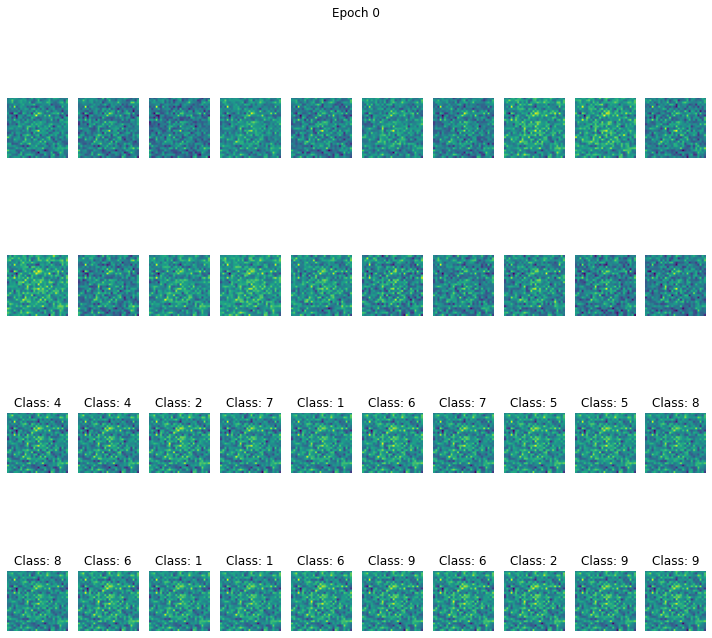

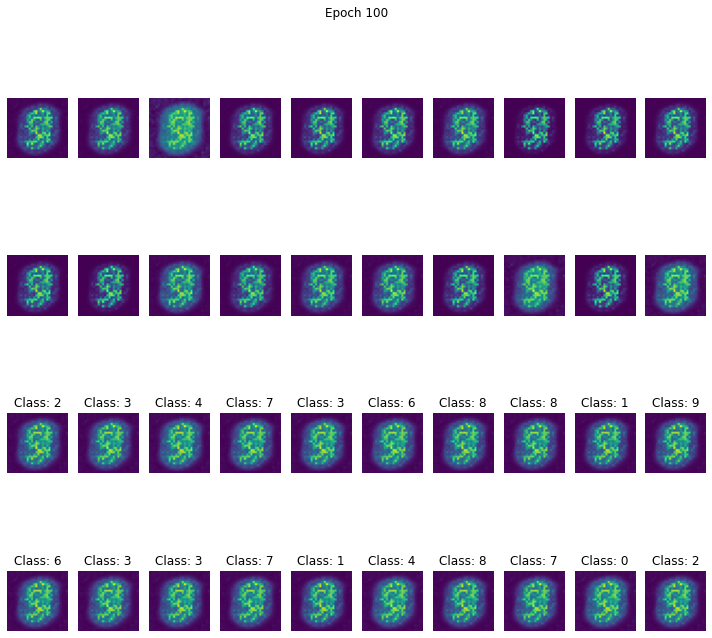

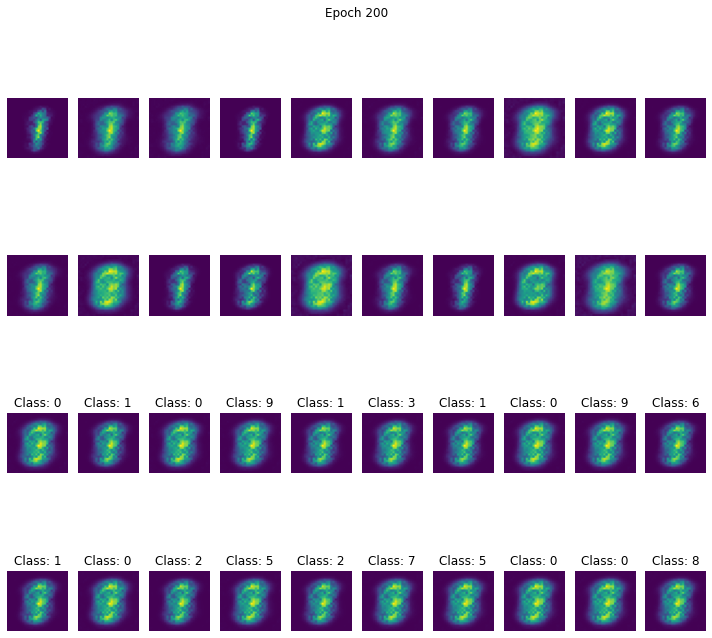

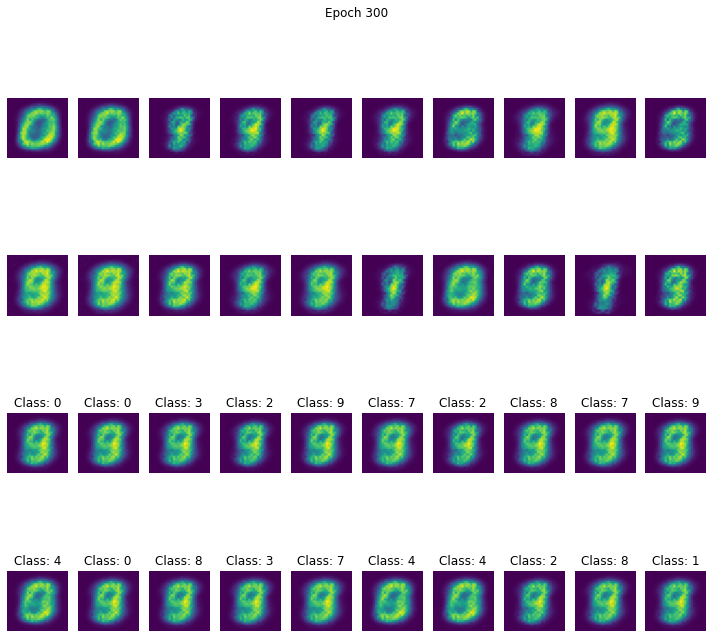

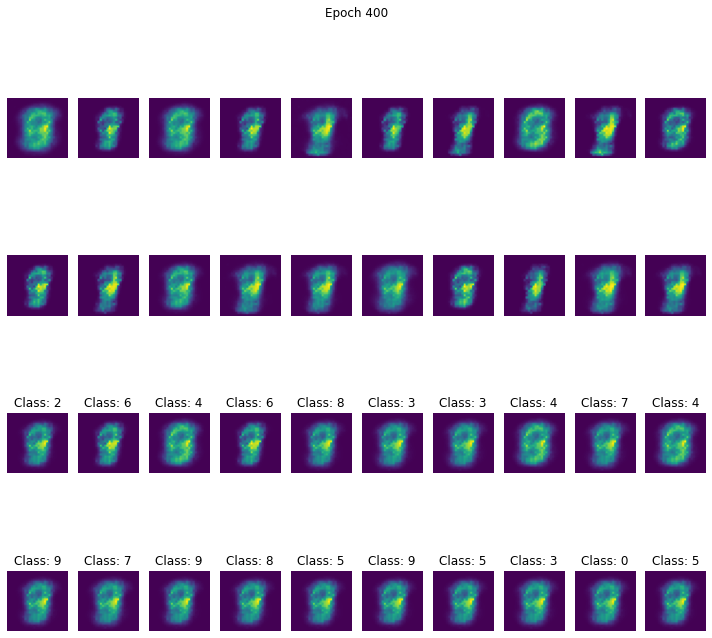

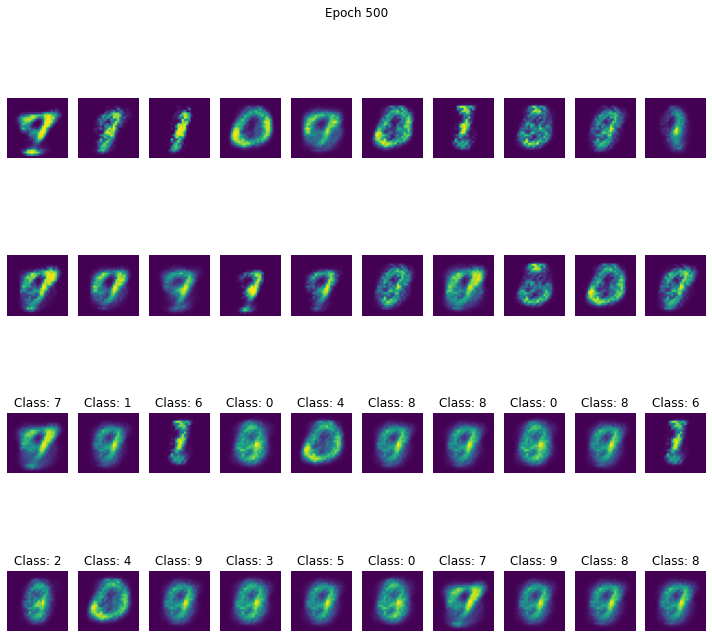

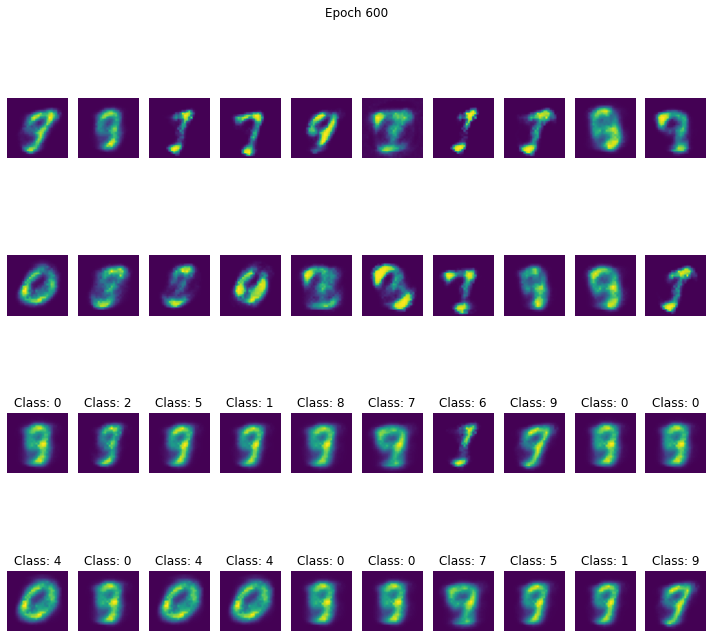

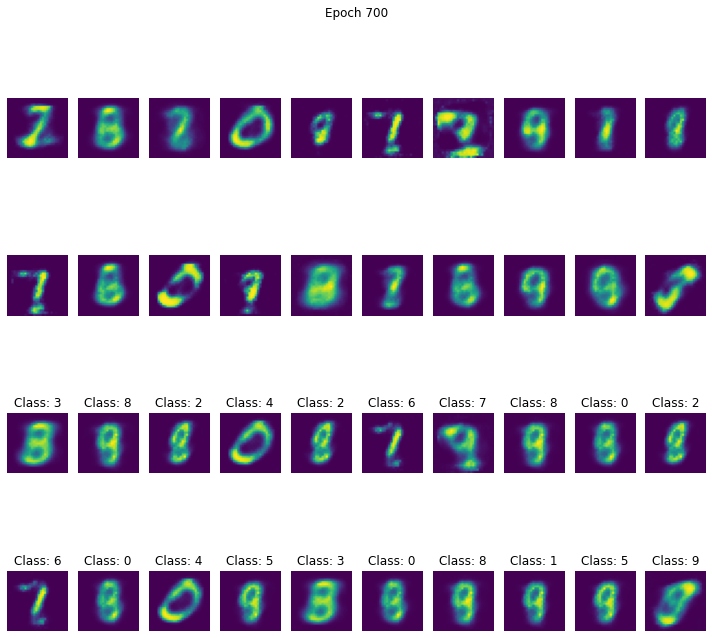

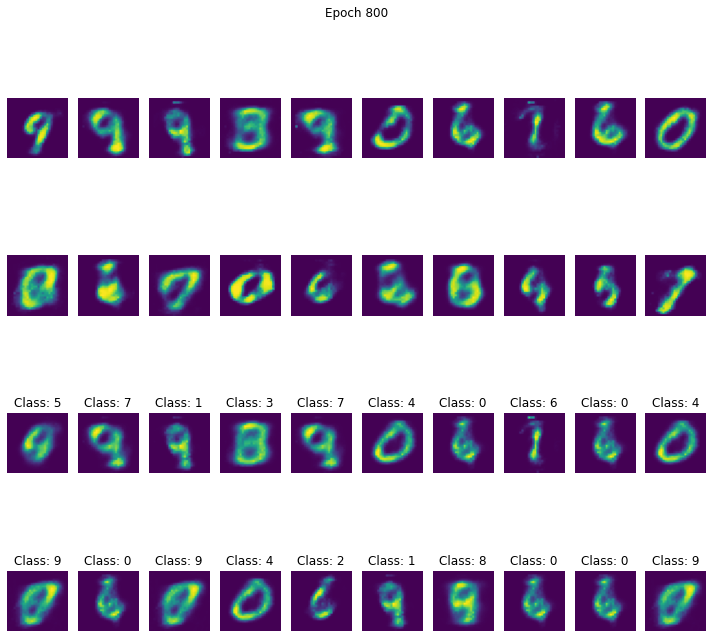

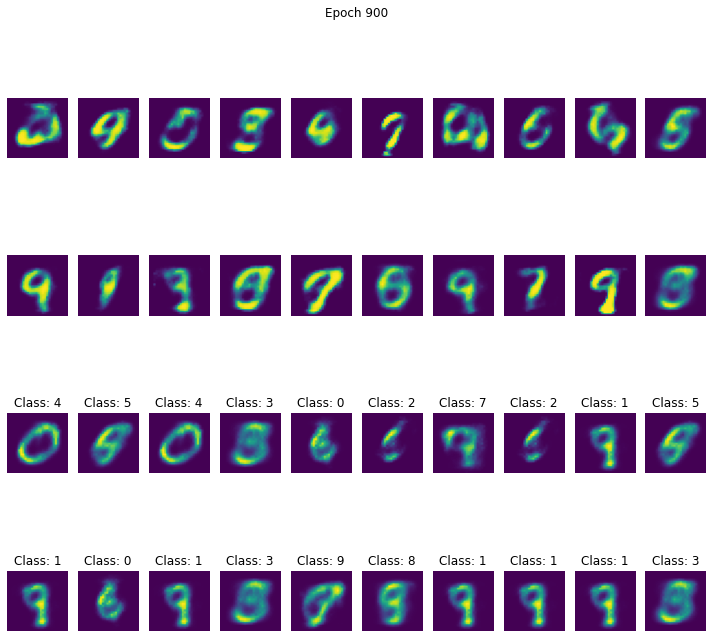

No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longer using instance noise
No longe

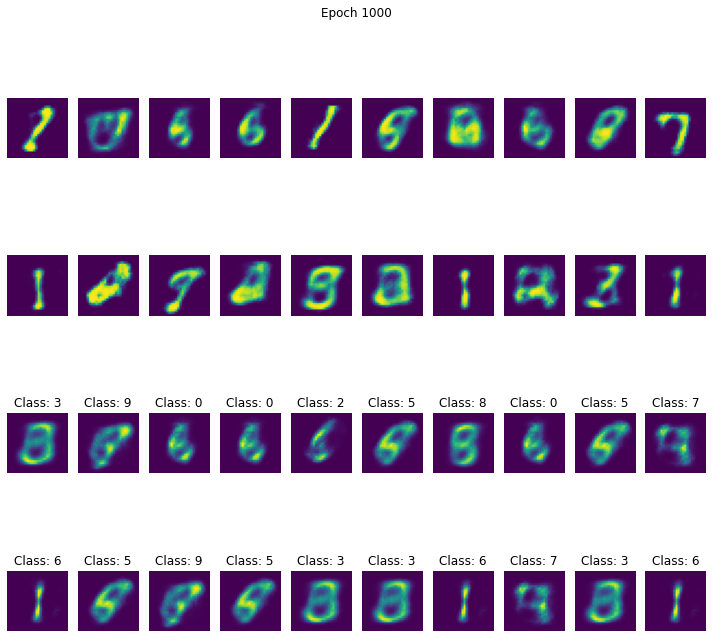

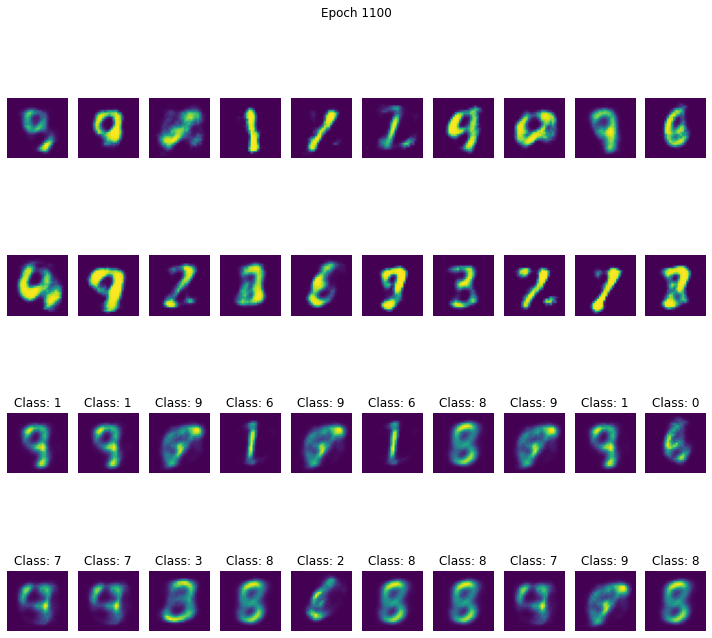

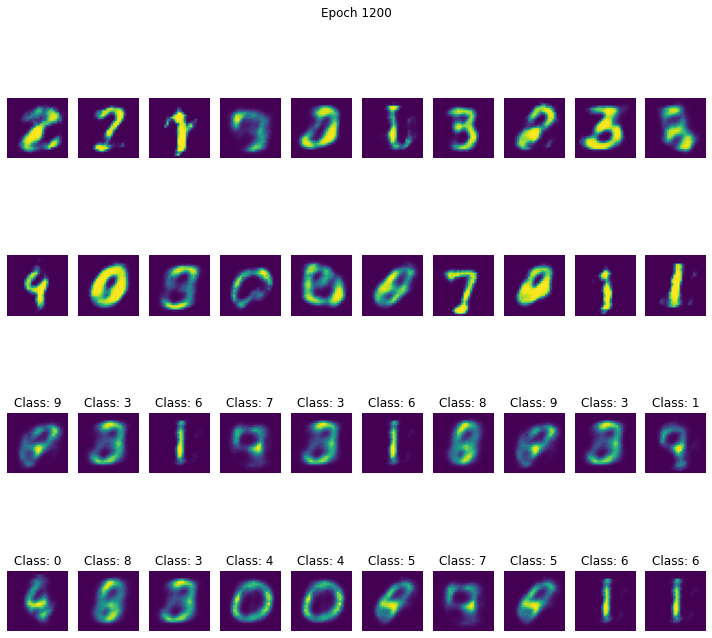

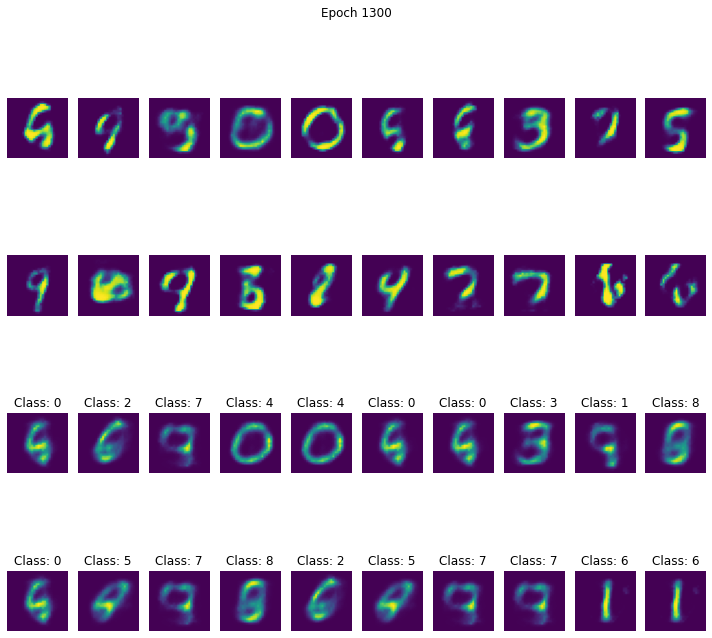

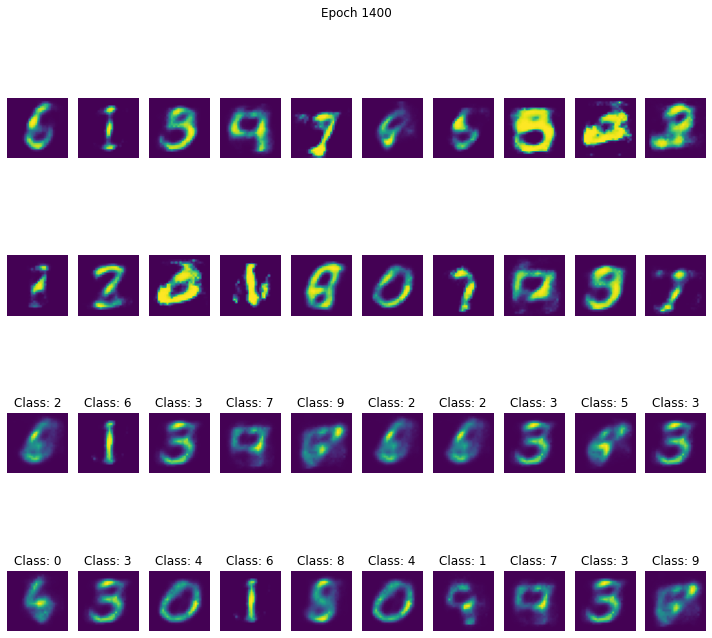

...

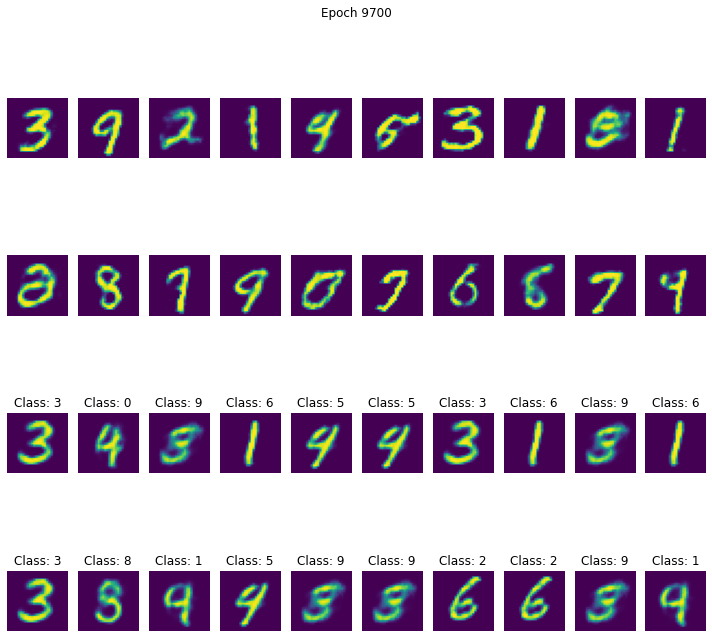

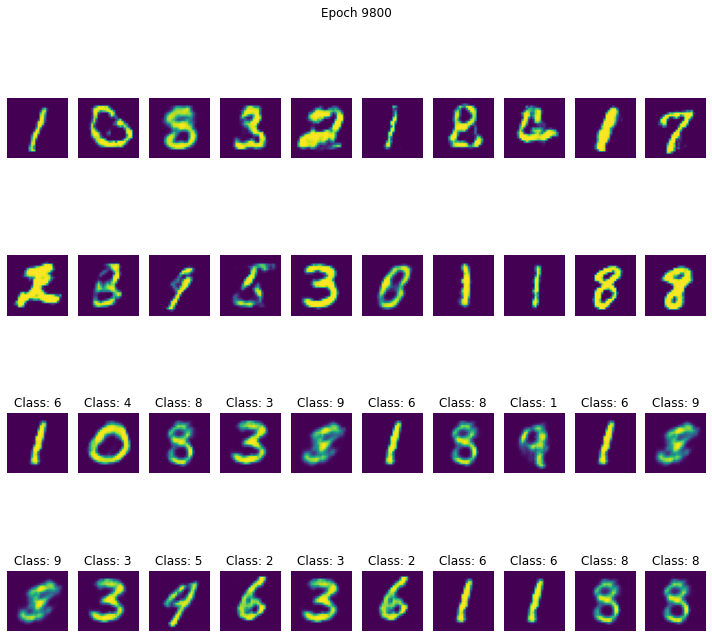

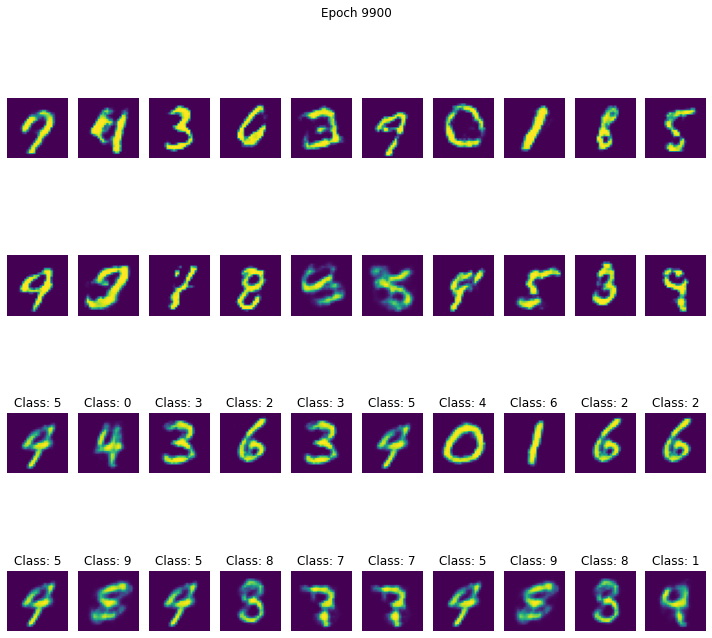

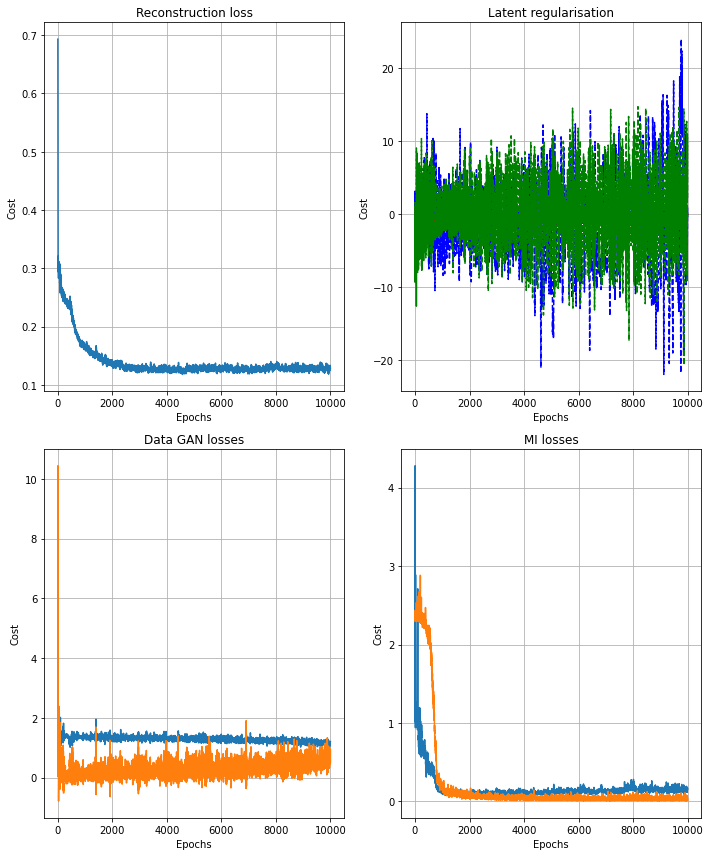

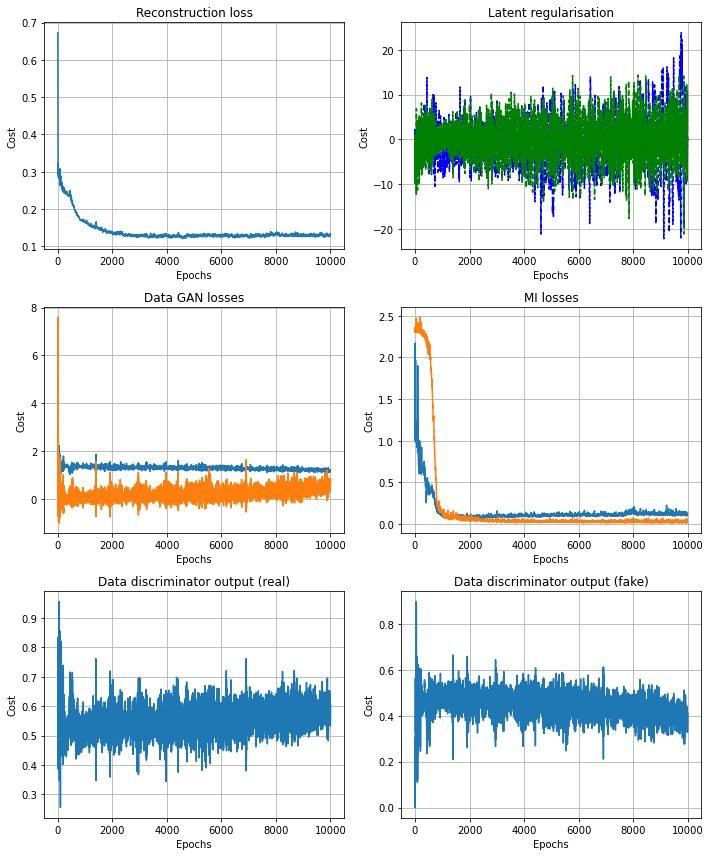

In [29]:
data_size = 784
no_classes = 10
latent_size = [2, no_classes, 20]
epochs = 10000

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

encode_dict = { "ff_layers":[data_size, 512, 256, 128, sum(latent_size)],
                "conv_flag":False }

decode_dict = { "ff_layers":[sum(latent_size), 128, 256, 512, data_size],
                "conv_flag":False }

prior_dict = None

#Define model
model = REPGAN_model(data_size, 
                     latent_size, 
                     encode_dict, 
                     decode_dict, 
                     prior_dict, 
                     var_decode = False, 
                     binary_decode = True, 
                     continuous_prior = False, 

                     InfoGAN_flag = True)

#push to training device
model.to(model.device)

#Define optimiser
REPGAN_opt = REPGAN_optimiser(model, 
                              pair_flag = False,
                              InfoGAN_flag = True)

#Define VAE cost
REPGAN_cost = REPGAN_loss(latent_size, "BCE", gamma = 40, beta = 1)

#setup model trainer
#indices 1 and 3 are digits zero and one
#pair_points = torch.from_numpy(np.vstack((mnist_train[1][0], mnist_train[3][0]))).float().cuda()

my_trainer = REPGAN_trainer(model, 
                            REPGAN_opt, 
                            REPGAN_cost, 
                            train_loader, 
                            valid_loader, 
                            epochs, 
                            int(0.1 * epochs), 
                            pairwise_samples = None)

#View model
print(model)

#Train model
my_trainer.train_model()

#Plot results
my_trainer.plotter()

tensor([5, 8, 2, 5, 8, 8, 2, 5, 1, 4, 4, 8, 5, 3, 3, 6, 8, 8, 8, 4],
       device='cuda:0') [5 8 2 5 8 8 2 5 1 4 4 8 5 3 3 6 8 8 8 4] [5 8 2 5 8 8 2 5 1 4 4 8 5 9 3 6 8 8 8 4]
0.17241845


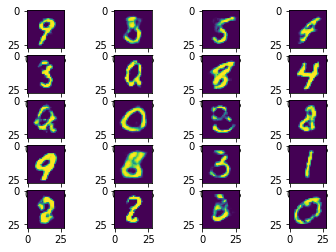

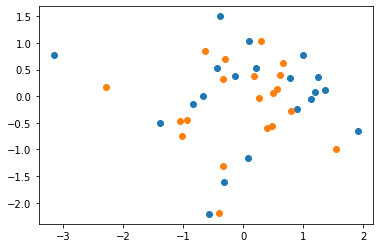

In [30]:
with torch.no_grad():
    z_sample, l = my_trainer.sample_latent(20)
    
    #z_sample[:, 0:latent_size[0]] = 0
    #z_sample[:, -latent_size[-1]:] = 0
    Xgen, _ = model.decoder(z_sample, torch.zeros_like(z_sample))
    
    mu_z, _ = model.encoder(Xgen)
    c = mu_z[:, latent_size[0]:latent_size[0] + latent_size[1]]

    z_sample = z_sample.detach().cpu().numpy()
    Xgen = Xgen.detach().cpu().numpy()
    mu_z = mu_z.detach().cpu().numpy()
    c = c.detach().cpu().numpy()
    
    print(l[1], np.argmax(z_sample[:, latent_size[0]:latent_size[0] + latent_size[1]], axis = 1), np.argmax(c, axis = 1))
    print(np.mean((z_sample[:, 0:latent_size[0]] - mu_z[:, 0:latent_size[0]])**2))

    fig, ax = plt.subplots(5, 4)
    ax = ax.flatten()

    for cnt, axs in enumerate(ax):
        axs.imshow(Xgen[cnt, :].reshape(28, 28))
    
    plt.show()

    plt.figure()
    plt.scatter(z_sample[:, 0], z_sample[:, 1])
    plt.scatter(mu_z[:, 0], mu_z[:, 1])
    plt.show()

tensor(1) [0 1 2 3 4 5 6 7 8 9] [0 1 2 3 4 5 6 7 8 9]
0.056397617


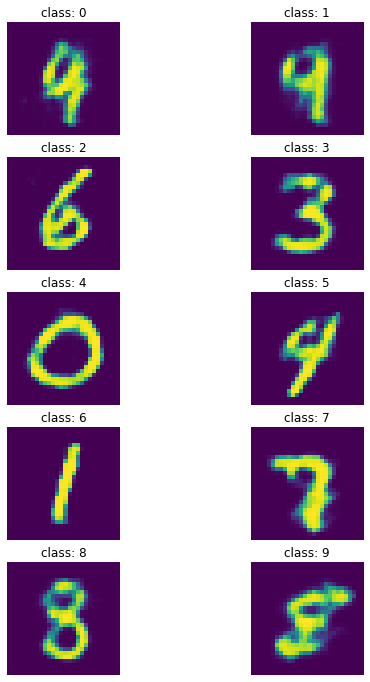

In [31]:
with torch.no_grad():
    z_sample = torch.zeros((no_classes, sum(latent_size)))
    l = torch.arange(no_classes)
    z_sample[l, range(latent_size[0], latent_size[0] + latent_size[1], 1)] = 1
    z_sample = z_sample.cuda()
    
    #z_sample[:, 0:latent_size[0]] = 0
    #z_sample[:, -latent_size[-1]:] = 0
    Xgen, _ = model.decoder(z_sample, torch.zeros_like(z_sample))
    
    mu_z, _ = model.encoder(Xgen)
    c = mu_z[:, latent_size[0]:latent_size[0] + latent_size[1]]

    z_sample = z_sample.detach().cpu().numpy()
    Xgen = Xgen.detach().cpu().numpy()
    mu_z = mu_z.detach().cpu().numpy()
    c = c.detach().cpu().numpy()
    
    print(l[1], np.argmax(z_sample[:, latent_size[0]:latent_size[0] + latent_size[1]], axis = 1), np.argmax(c, axis = 1))
    print(np.mean((z_sample[:, 0:latent_size[0]] - mu_z[:, 0:latent_size[0]])**2))

    fig, ax = plt.subplots(no_classes // 2, 2, figsize = (8, 12))
    ax = ax.flatten()

    for cnt, axs in enumerate(ax):
        axs.set_title("class: {}".format(l[cnt]))
        axs.imshow(Xgen[cnt, :].reshape(28, 28))
        axs.axis("off")
    plt.show()

tensor([[0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        ...,
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.],
        [0., 0., 0.,  ..., 0., 0., 0.]])


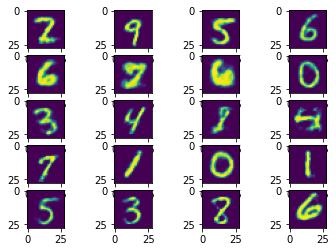

tensor([-0.3210, -0.5817,  0.4565,  0.2413,  0.6651, -0.9723,  0.9189, -0.0868,
         0.2262, -1.1942], device='cuda:0', grad_fn=<SliceBackward>) tensor([[0.0634, 0.0489, 0.1380, 0.1113, 0.1700, 0.0331, 0.2191, 0.0802, 0.1096,
         0.0265]], device='cuda:0', grad_fn=<SoftmaxBackward>)

[0. 0. 1. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0. 0.
 0. 0. 0. 0. 0. 0. 0. 0.]


In [32]:
d, l = next(iter(train_loader))

print(d)

encode_out = model.encoder(d.cuda())
encode_out2 = model.encoder(d.cuda(), softmax_flag = False)
Xgen, _ = model.decoder(encode_out[0], torch.zeros_like(encode_out[0]))

Xgen = Xgen.detach().cpu().numpy()

fig, ax = plt.subplots(5, 4)
ax = ax.flatten()

for cnt, axs in enumerate(ax):
    axs.imshow(Xgen[cnt, :].reshape(28, 28))

plt.show()

print(encode_out[0][0, 20:30], F.softmax(encode_out2[0][0, 20:30].reshape(1, -1), dim = 1))
print()
print(z_sample[0, :])

In [33]:
sample_c, labels = my_trainer.cost.sample_categorical_prior(5)
print(sample_c)

#print(model.N_prior()[0] + torch.randn(10, 20).cuda() * torch.sqrt(model.N_prior()[1]))
#print(my_trainer.cost.sample_prior(*model.N_prior(), 10))

tensor([[0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
        [0., 0., 0., 1., 0., 0., 0., 0., 0., 0.],
        [0., 0., 0., 0., 0., 0., 0., 0., 1., 0.],
        [0., 0., 0., 0., 0., 0., 0., 1., 0., 0.],
        [1., 0., 0., 0., 0., 0., 0., 0., 0., 0.]], device='cuda:0')
